In [16]:
import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
!pip install torchviz
from torchviz import make_dot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [17]:
DATA_FOLDER = './torch_data/VGAN/MNIST'

def mnist_data():
    compose = transforms.Compose([transforms.ToTensor(),transforms.Normalize((.5,), (.5,))])
    out_dir = '{}/dataset'.format(DATA_FOLDER)
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)

data = mnist_data()
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
num_batches = len(data_loader)
print('num_batches: ',num_batches)

num_batches:  600


(100, 1, 28, 28)


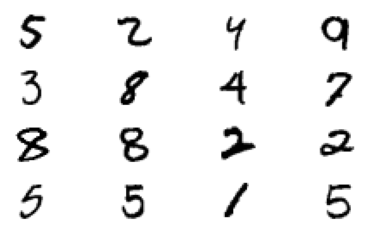

In [18]:
def save_plot(x_input,n=4):
    # x_input = x_input.cpu().detach().numpy()
    x_input = x_input.reshape(x_input.shape[0], x_input.shape[2], x_input.shape[3], x_input.shape[1])
    # plt.subplots(figsize=(20, 10))
    plt.figure(figsize=(7, 4))
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        # plt.title(str(lebel[i]),fontsize=10,color="red",fontweight=10,pad='2.0',backgroundcolor='yellow')
        plt.imshow(x_input[i,:,:,0], cmap = 'gray_r')
        plt.axis('off')
    plt.show()
for i,(j,k) in enumerate(data_loader):
  j=j.numpy()
  print(j.shape)
  save_plot(j,n=4)
  break

In [19]:
class DiscriminatorNet(torch.nn.Module):
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
    
discriminator_temp = DiscriminatorNet()
print(discriminator_temp)

DiscriminatorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
    (1): Sigmoid()
  )
)


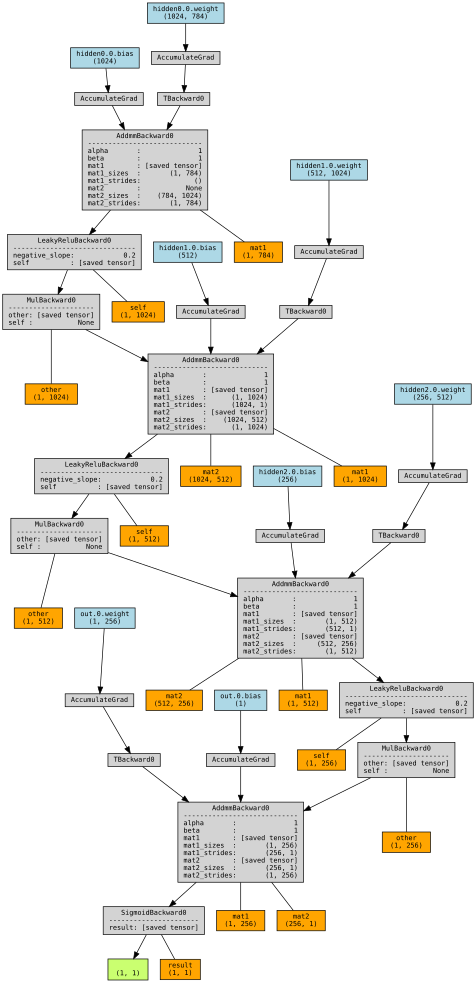

In [20]:
generator_temp = torch.randn(1, 28*28)
discriminator_temp = DiscriminatorNet()
y = discriminator_temp(generator_temp) # Give dummy batch to forward().
make_dot(y, params=dict(list(discriminator_temp.named_parameters())), show_attrs=True, show_saved=True) #.render("rnn_torchviz", format="png")

In [21]:
class GeneratorNet(torch.nn.Module):
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

generator_temp = GeneratorNet()
print(generator_temp)

GeneratorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=100, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (out): Sequential(
    (0): Linear(in_features=1024, out_features=784, bias=True)
    (1): Tanh()
  )
)


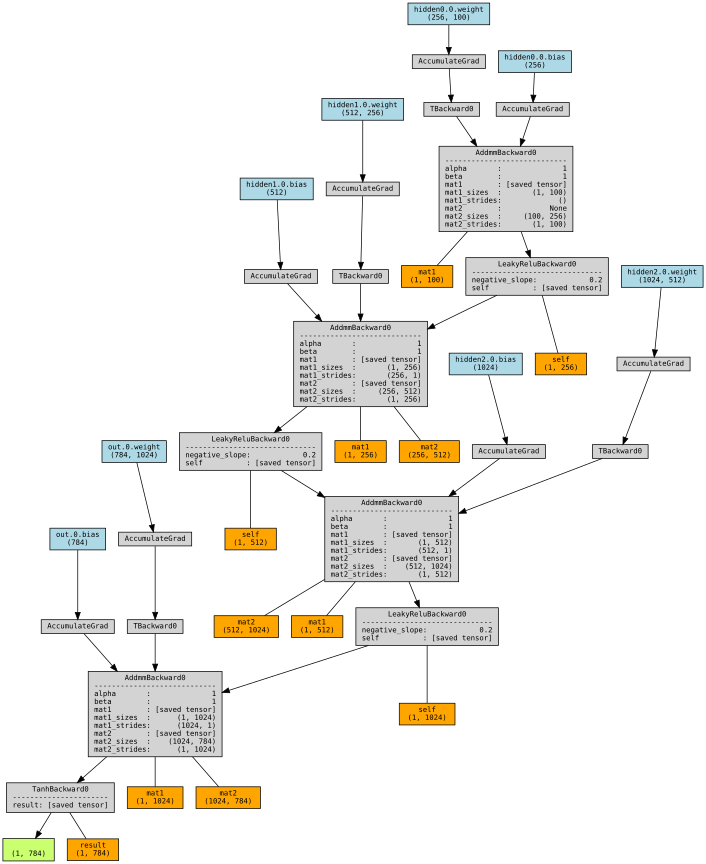

In [22]:
sample_data = torch.randn(1, 100)
generator_temp = GeneratorNet()
y = generator_temp(sample_data) # Give dummy batch to forward().
make_dot(y, params=dict(list(generator_temp.named_parameters())), show_attrs=True, show_saved=True) #.render("rnn_torchviz", format="png")

In [23]:
p = Variable(torch.randn(16, 100))
print(p.size())
k=generator_temp(p)
print(k.size())


torch.Size([16, 100])
torch.Size([16, 784])


In [24]:
discriminator = DiscriminatorNet()
generator = GeneratorNet()
# print(torch.cuda.is_available())
if torch.cuda.is_available():
  print('cuda availiable')
  discriminator.cuda()
  generator.cuda()

cuda availiable


In [25]:
# Optimizers
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

# Loss function
loss = nn.BCELoss()

# if torch.cuda.is_available():
#   loss.cuda()

In [26]:
def save_plot(x_input,n=4):
    # x_input = x_input.cpu().detach().numpy()
    # x_input = x_input.reshape(x_input.shape[0], x_input.shape[2], x_input.shape[3], x_input.shape[1])
    plt.figure(figsize=(7, 4))
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        # plt.title(str(lebel[i]),fontsize=10,color="red",fontweight=10,pad='2.0',backgroundcolor='yellow')
        plt.imshow(x_input[i,:,:,0], cmap = 'gray_r')
        plt.axis('off')
    plt.show()
def summarize_the_model(generator, latent_dim = 100):
    latent_points = Variable(torch.randn(16, latent_dim))
    if torch.cuda.is_available():
      latent_points = latent_points.cuda()
    X  = generator(latent_points)
    X  = X.cpu().detach().numpy()   # X  = X.cpu().detach().numpy() 
    X  = X.reshape(16, 28, 28, 1) 
    # scale from [-1,1] to [0,1]
    X = (X + 1) / 2.0
    save_plot(X, n=4)
    print('*'*130,"\n")

In [27]:
def fake_data_and_target(image, latent_dim=100):
  noise = Variable(torch.randn(image.size(0), latent_dim))
  target = Variable(torch.zeros(image.size(0), 1))
  if torch.cuda.is_available():
    noise = noise.cuda()
    target = target.cuda()
  return noise, target

def real_data_and_target(image):
  real = Variable(image)
  target = Variable(torch.ones(image.size(0), 1))
  if torch.cuda.is_available():
    real=real.cuda()
    target=target.cuda()
  return real,target

In [28]:
for n_batch, (real_batch,_) in enumerate(data_loader):
  a,b = fake_data_and_target(real_batch, latent_dim=100)
  print('fake: ',a.size(),b.size())
  c,d =  real_data_and_target(real_batch)
  print('real: ',c.size(),d.size())
  break

fake:  torch.Size([100, 100]) torch.Size([100, 1])
real:  torch.Size([100, 1, 28, 28]) torch.Size([100, 1])


In [29]:
def train(data, discriminator, generator, d_optimizer, g_optimizer, loss,  epochs=15):
  for epoch in range(epochs):
    d_error_total, g_error_total = 0.0, 0.0
    for n_batch, (real_batch,_) in enumerate(data):

      # ******************************************************************************************************
      # discriminator
      d_optimizer.zero_grad()

      ## real
      # print(n_batch)
      # print(real_batch.size(),real_batch.size(0))
      real_batch = real_batch.view(real_batch.size(0), 784)
      # print(real_batch.size())
      real_data, real_target =  real_data_and_target(real_batch)
      # print('real_data: ', real_data.size(), 'real_target: ', real_target.size())

      r_predicted_target = discriminator(real_data)
      r_error = loss(r_predicted_target, real_target)
      r_error.backward()
      # d_optimizer.step()

      ## fake
      fake_data, fake_target =  fake_data_and_target(real_batch)
      # print('fake_data: ', fake_data.size(), 'fake_target: ', fake_target.size())

      noise_data = generator(fake_data).detach()
      f_predicted_target = discriminator(noise_data)
      f_error = loss(f_predicted_target, fake_target)
      f_error.backward()
      # d_optimizer.step()

      d_error_temp = (r_error.item()+f_error.item())
      # d_error_temp.backward()

      d_optimizer.step()

      d_error_total += (d_error_temp/real_batch.size(0))

      # *******************************************************************************************************
      # generator
      g_optimizer.zero_grad()

      ## fake
      g_fake_data, g_fake_target =  fake_data_and_target(real_batch)

      g_noise_data = generator(g_fake_data)
      g_predicted_target = discriminator(g_noise_data)
      g_error = loss(g_predicted_target, real_target)
      g_error.backward()

      g_optimizer.step()

      g_error_total += (g_error.item()/real_batch.size(0))
      # print('d_error: ', d_error_temp.item(), '        g_error: ', g_error.item())
      # break
    print('epoch -> [%d/%d], d_loss = %f, g_loss = %f' %(epoch+1, epochs, d_error_total/num_batches, g_error_total/num_batches))
    # break
    summarize_the_model(generator)

epoch -> [1/400], d_loss = 0.009476, g_loss = 0.024949


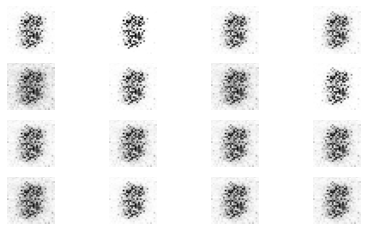

********************************************************************************************************************************** 

epoch -> [2/400], d_loss = 0.010940, g_loss = 0.014987


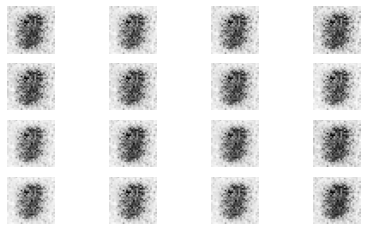

********************************************************************************************************************************** 

epoch -> [3/400], d_loss = 0.009979, g_loss = 0.018660


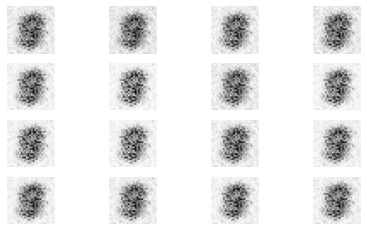

********************************************************************************************************************************** 

epoch -> [4/400], d_loss = 0.008307, g_loss = 0.022817


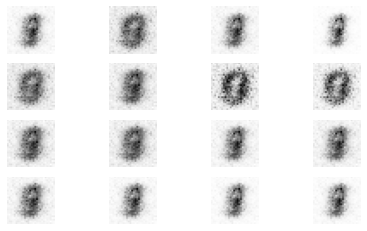

********************************************************************************************************************************** 

epoch -> [5/400], d_loss = 0.007100, g_loss = 0.024165


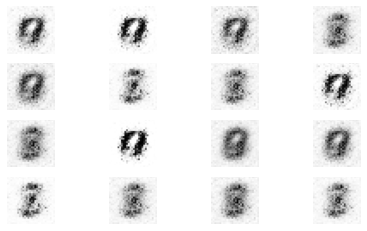

********************************************************************************************************************************** 

epoch -> [6/400], d_loss = 0.006019, g_loss = 0.028385


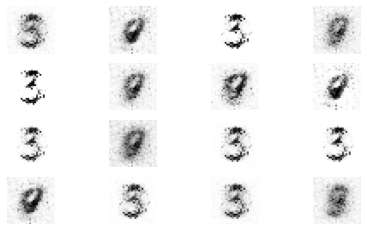

********************************************************************************************************************************** 

epoch -> [7/400], d_loss = 0.005500, g_loss = 0.028092


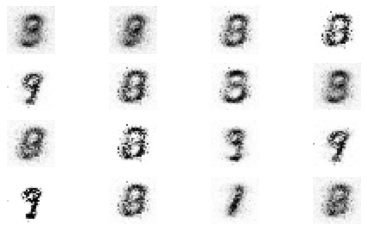

********************************************************************************************************************************** 

epoch -> [8/400], d_loss = 0.005807, g_loss = 0.025077


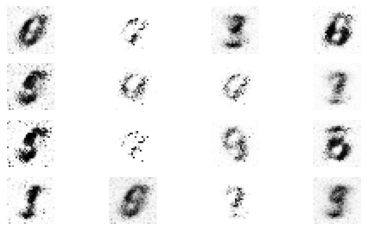

********************************************************************************************************************************** 

epoch -> [9/400], d_loss = 0.006227, g_loss = 0.023757


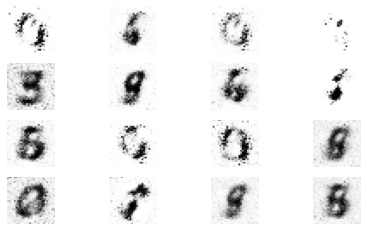

********************************************************************************************************************************** 

epoch -> [10/400], d_loss = 0.006056, g_loss = 0.023943


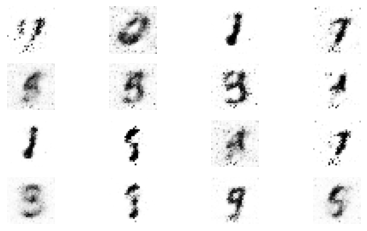

********************************************************************************************************************************** 

epoch -> [11/400], d_loss = 0.007059, g_loss = 0.021160


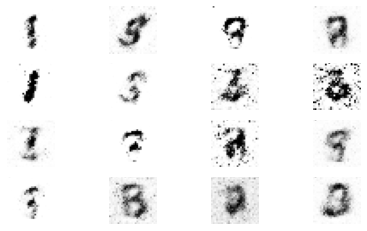

********************************************************************************************************************************** 

epoch -> [12/400], d_loss = 0.007229, g_loss = 0.022024


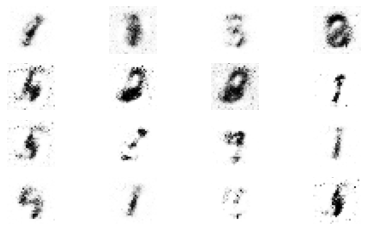

********************************************************************************************************************************** 

epoch -> [13/400], d_loss = 0.007033, g_loss = 0.022051


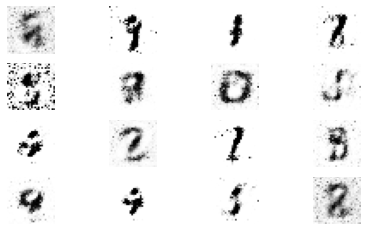

********************************************************************************************************************************** 

epoch -> [14/400], d_loss = 0.007460, g_loss = 0.020556


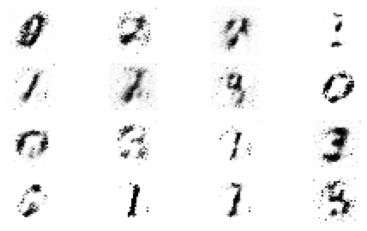

********************************************************************************************************************************** 

epoch -> [15/400], d_loss = 0.007506, g_loss = 0.020882


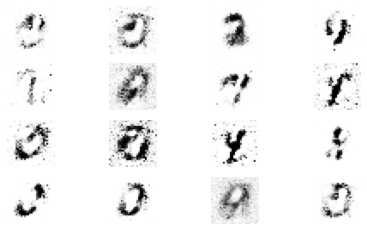

********************************************************************************************************************************** 

epoch -> [16/400], d_loss = 0.007840, g_loss = 0.018984


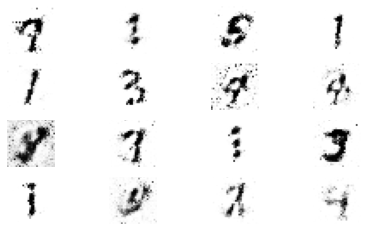

********************************************************************************************************************************** 

epoch -> [17/400], d_loss = 0.008325, g_loss = 0.018034


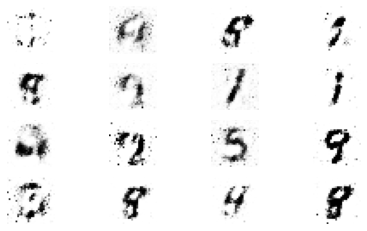

********************************************************************************************************************************** 

epoch -> [18/400], d_loss = 0.008078, g_loss = 0.018542


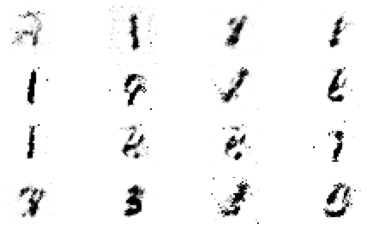

********************************************************************************************************************************** 

epoch -> [19/400], d_loss = 0.008472, g_loss = 0.017957


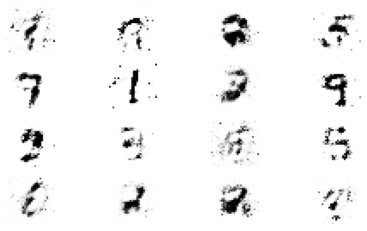

********************************************************************************************************************************** 

epoch -> [20/400], d_loss = 0.008554, g_loss = 0.017557


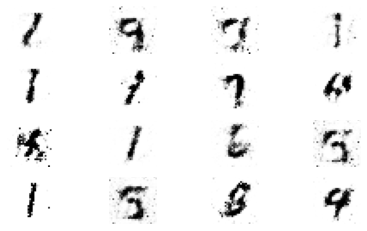

********************************************************************************************************************************** 

epoch -> [21/400], d_loss = 0.008629, g_loss = 0.017176


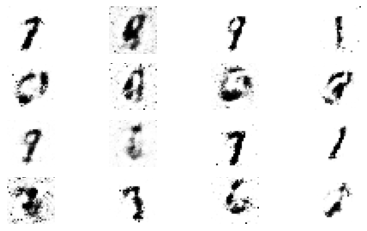

********************************************************************************************************************************** 

epoch -> [22/400], d_loss = 0.009106, g_loss = 0.016142


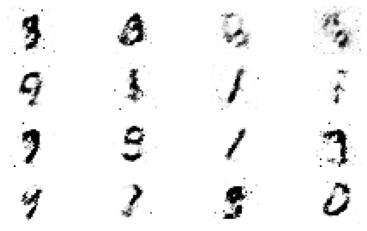

********************************************************************************************************************************** 

epoch -> [23/400], d_loss = 0.009253, g_loss = 0.015539


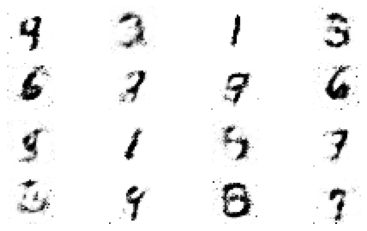

********************************************************************************************************************************** 

epoch -> [24/400], d_loss = 0.009357, g_loss = 0.015354


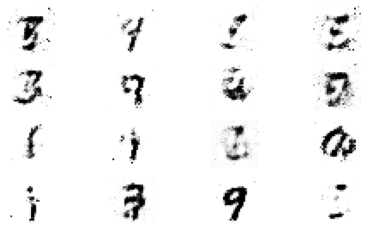

********************************************************************************************************************************** 

epoch -> [25/400], d_loss = 0.009561, g_loss = 0.015114


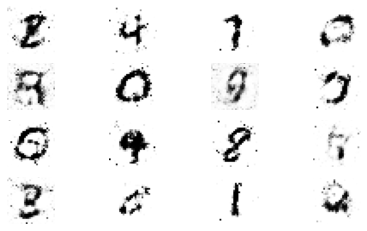

********************************************************************************************************************************** 

epoch -> [26/400], d_loss = 0.009498, g_loss = 0.015381


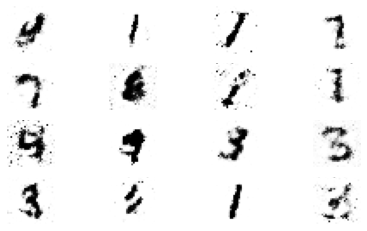

********************************************************************************************************************************** 

epoch -> [27/400], d_loss = 0.009625, g_loss = 0.014936


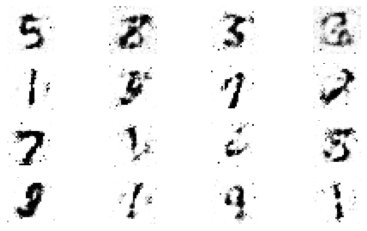

********************************************************************************************************************************** 

epoch -> [28/400], d_loss = 0.009841, g_loss = 0.014443


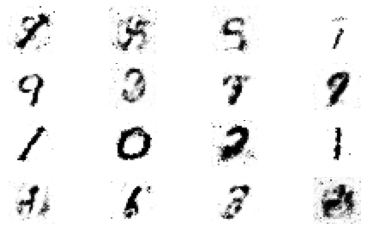

********************************************************************************************************************************** 

epoch -> [29/400], d_loss = 0.009903, g_loss = 0.014645


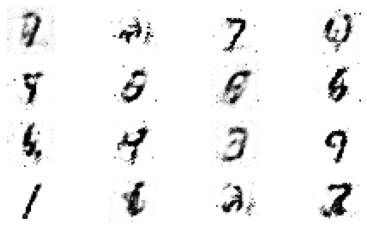

********************************************************************************************************************************** 

epoch -> [30/400], d_loss = 0.009875, g_loss = 0.014457


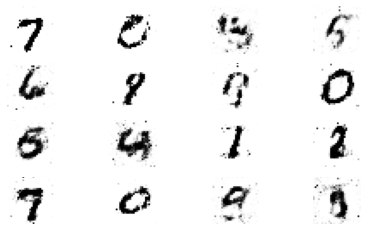

********************************************************************************************************************************** 

epoch -> [31/400], d_loss = 0.010046, g_loss = 0.013974


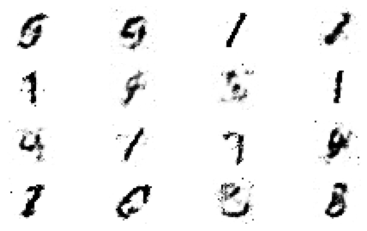

********************************************************************************************************************************** 

epoch -> [32/400], d_loss = 0.010422, g_loss = 0.013125


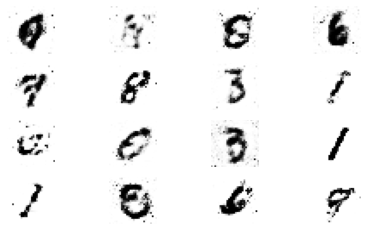

********************************************************************************************************************************** 

epoch -> [33/400], d_loss = 0.010562, g_loss = 0.012778


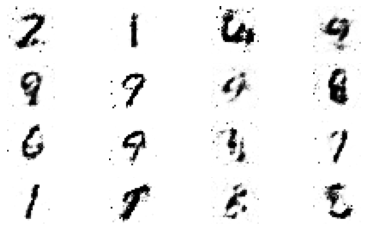

********************************************************************************************************************************** 

epoch -> [34/400], d_loss = 0.010596, g_loss = 0.013035


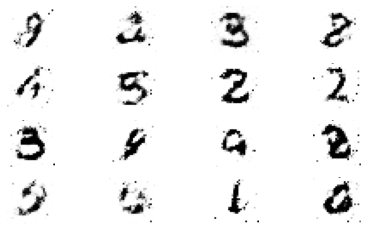

********************************************************************************************************************************** 

epoch -> [35/400], d_loss = 0.010590, g_loss = 0.013011


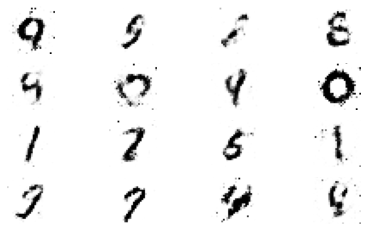

********************************************************************************************************************************** 

epoch -> [36/400], d_loss = 0.010815, g_loss = 0.012579


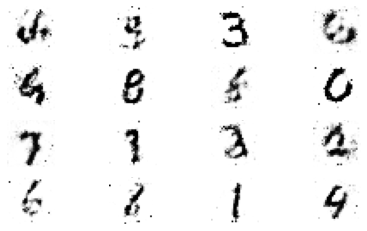

********************************************************************************************************************************** 

epoch -> [37/400], d_loss = 0.010824, g_loss = 0.012265


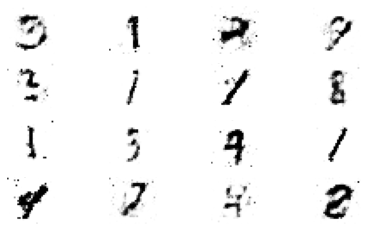

********************************************************************************************************************************** 

epoch -> [38/400], d_loss = 0.010948, g_loss = 0.012250


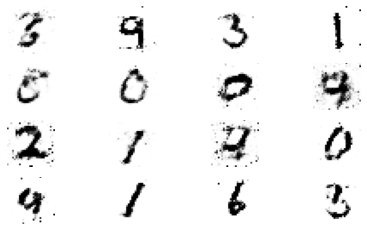

********************************************************************************************************************************** 

epoch -> [39/400], d_loss = 0.010781, g_loss = 0.012596


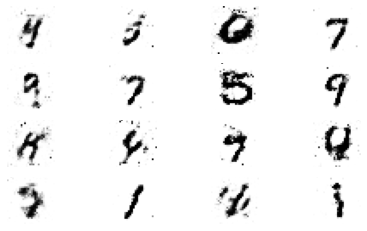

********************************************************************************************************************************** 

epoch -> [40/400], d_loss = 0.010741, g_loss = 0.012795


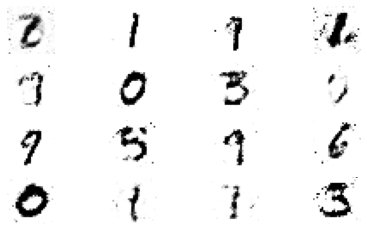

********************************************************************************************************************************** 

epoch -> [41/400], d_loss = 0.010884, g_loss = 0.012445


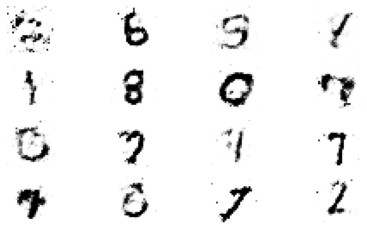

********************************************************************************************************************************** 

epoch -> [42/400], d_loss = 0.010962, g_loss = 0.012264


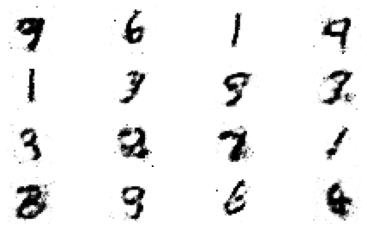

********************************************************************************************************************************** 

epoch -> [43/400], d_loss = 0.011124, g_loss = 0.011873


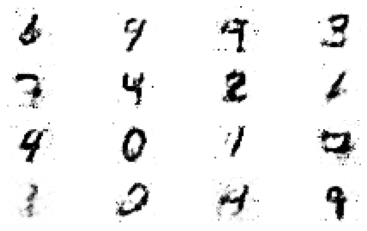

********************************************************************************************************************************** 

epoch -> [44/400], d_loss = 0.011320, g_loss = 0.011631


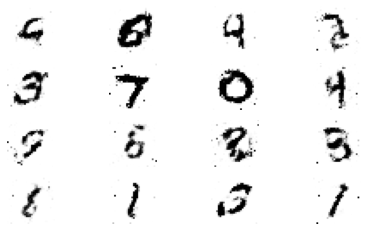

********************************************************************************************************************************** 

epoch -> [45/400], d_loss = 0.011242, g_loss = 0.011708


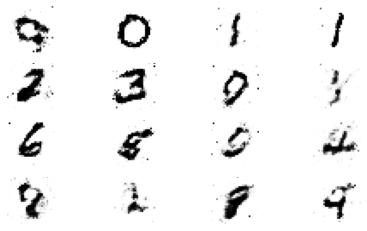

********************************************************************************************************************************** 

epoch -> [46/400], d_loss = 0.011251, g_loss = 0.011556


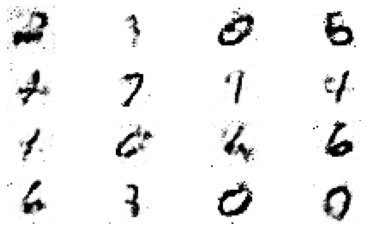

********************************************************************************************************************************** 

epoch -> [47/400], d_loss = 0.011348, g_loss = 0.011398


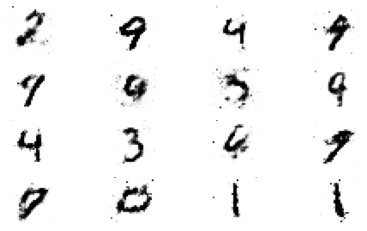

********************************************************************************************************************************** 

epoch -> [48/400], d_loss = 0.011537, g_loss = 0.011190


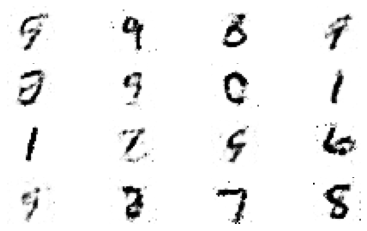

********************************************************************************************************************************** 

epoch -> [49/400], d_loss = 0.011532, g_loss = 0.011153


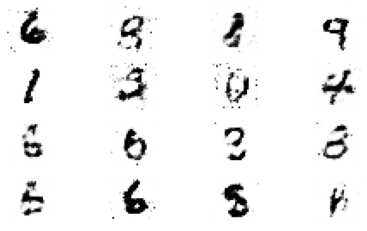

********************************************************************************************************************************** 

epoch -> [50/400], d_loss = 0.011575, g_loss = 0.011020


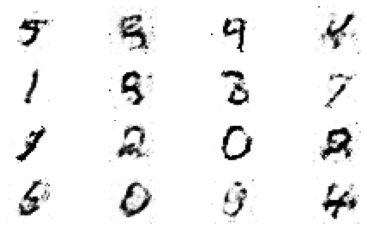

********************************************************************************************************************************** 

epoch -> [51/400], d_loss = 0.011688, g_loss = 0.010925


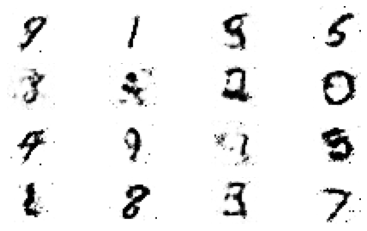

********************************************************************************************************************************** 

epoch -> [52/400], d_loss = 0.011733, g_loss = 0.010646


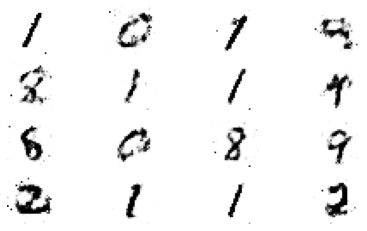

********************************************************************************************************************************** 

epoch -> [53/400], d_loss = 0.011826, g_loss = 0.010590


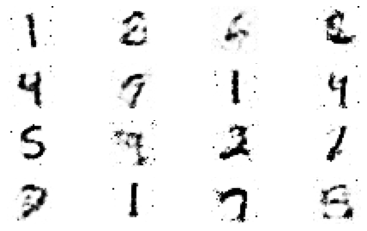

********************************************************************************************************************************** 

epoch -> [54/400], d_loss = 0.011772, g_loss = 0.010655


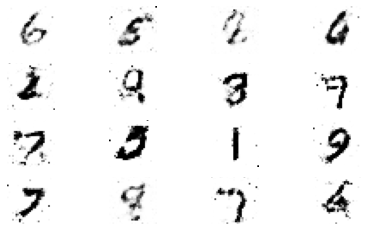

********************************************************************************************************************************** 

epoch -> [55/400], d_loss = 0.011763, g_loss = 0.010732


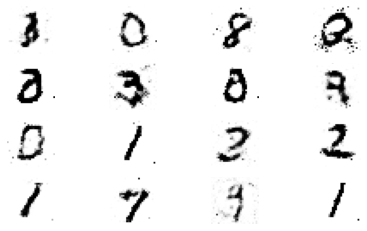

********************************************************************************************************************************** 

epoch -> [56/400], d_loss = 0.011803, g_loss = 0.010602


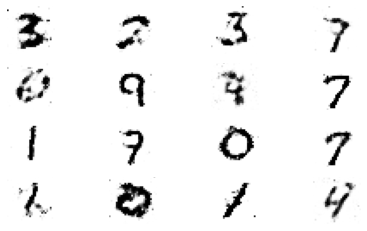

********************************************************************************************************************************** 

epoch -> [57/400], d_loss = 0.011864, g_loss = 0.010586


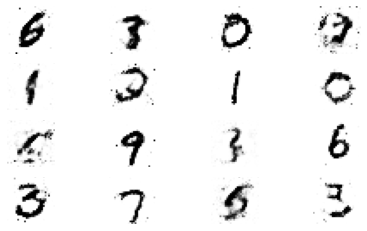

********************************************************************************************************************************** 

epoch -> [58/400], d_loss = 0.011853, g_loss = 0.010624


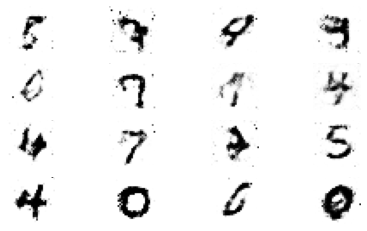

********************************************************************************************************************************** 

epoch -> [59/400], d_loss = 0.011922, g_loss = 0.010389


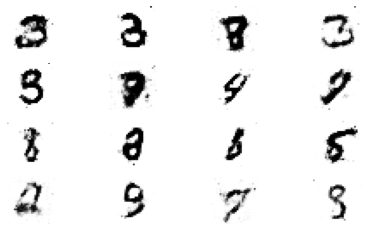

********************************************************************************************************************************** 

epoch -> [60/400], d_loss = 0.011985, g_loss = 0.010304


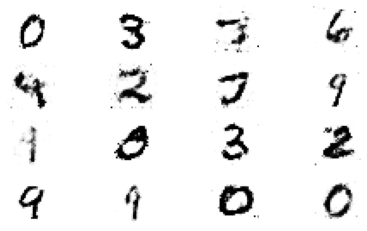

********************************************************************************************************************************** 

epoch -> [61/400], d_loss = 0.011927, g_loss = 0.010386


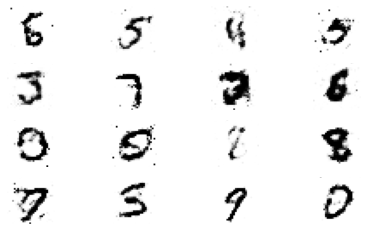

********************************************************************************************************************************** 

epoch -> [62/400], d_loss = 0.011855, g_loss = 0.010496


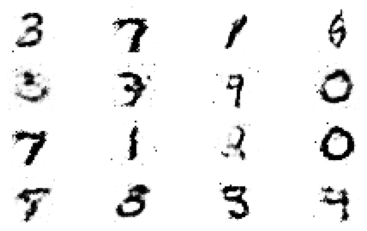

********************************************************************************************************************************** 

epoch -> [63/400], d_loss = 0.011941, g_loss = 0.010536


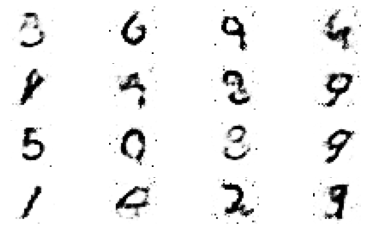

********************************************************************************************************************************** 

epoch -> [64/400], d_loss = 0.012007, g_loss = 0.010278


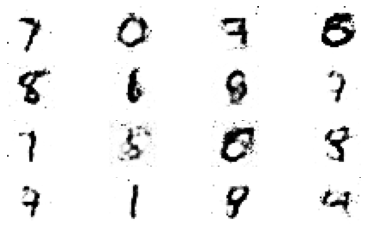

********************************************************************************************************************************** 

epoch -> [65/400], d_loss = 0.012120, g_loss = 0.010064


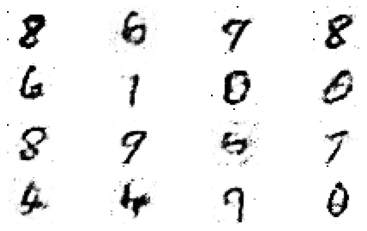

********************************************************************************************************************************** 

epoch -> [66/400], d_loss = 0.012011, g_loss = 0.010236


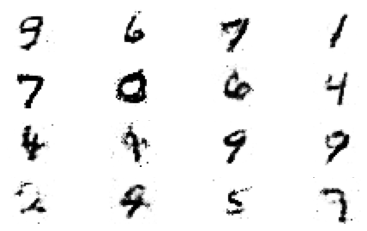

********************************************************************************************************************************** 

epoch -> [67/400], d_loss = 0.011936, g_loss = 0.010353


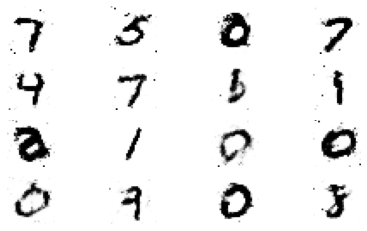

********************************************************************************************************************************** 

epoch -> [68/400], d_loss = 0.012040, g_loss = 0.010309


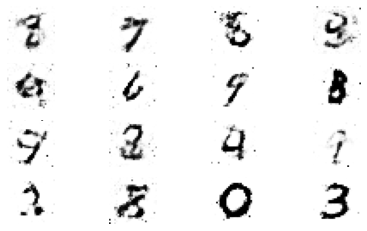

********************************************************************************************************************************** 

epoch -> [69/400], d_loss = 0.012021, g_loss = 0.010180


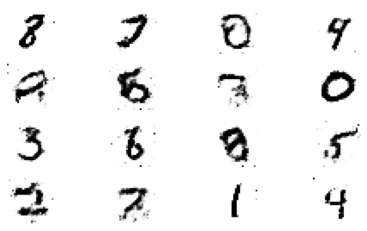

********************************************************************************************************************************** 

epoch -> [70/400], d_loss = 0.012055, g_loss = 0.010156


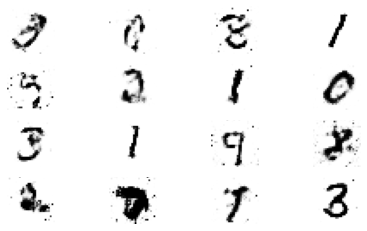

********************************************************************************************************************************** 

epoch -> [71/400], d_loss = 0.012204, g_loss = 0.009896


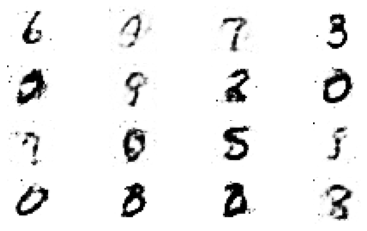

********************************************************************************************************************************** 

epoch -> [72/400], d_loss = 0.012200, g_loss = 0.009979


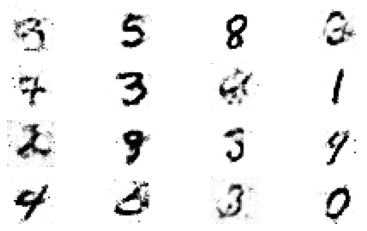

********************************************************************************************************************************** 

epoch -> [73/400], d_loss = 0.012155, g_loss = 0.010016


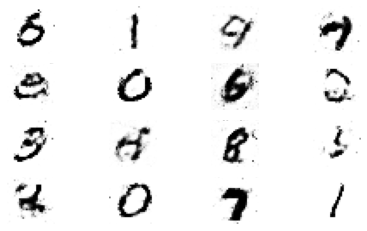

********************************************************************************************************************************** 

epoch -> [74/400], d_loss = 0.012186, g_loss = 0.010003


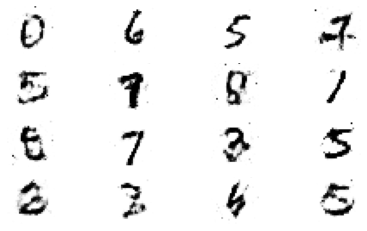

********************************************************************************************************************************** 

epoch -> [75/400], d_loss = 0.012243, g_loss = 0.010074


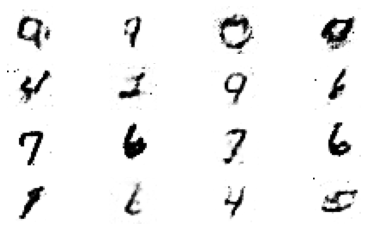

********************************************************************************************************************************** 

epoch -> [76/400], d_loss = 0.012271, g_loss = 0.009846


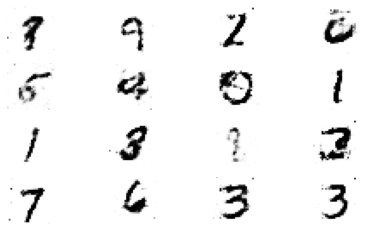

********************************************************************************************************************************** 

epoch -> [77/400], d_loss = 0.012309, g_loss = 0.009792


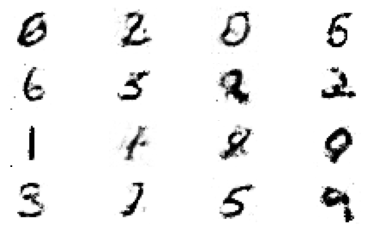

********************************************************************************************************************************** 

epoch -> [78/400], d_loss = 0.012298, g_loss = 0.009696


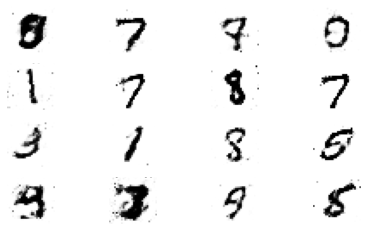

********************************************************************************************************************************** 

epoch -> [79/400], d_loss = 0.012322, g_loss = 0.009702


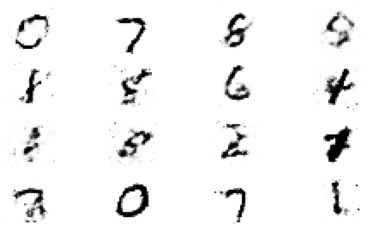

********************************************************************************************************************************** 

epoch -> [80/400], d_loss = 0.012384, g_loss = 0.009563


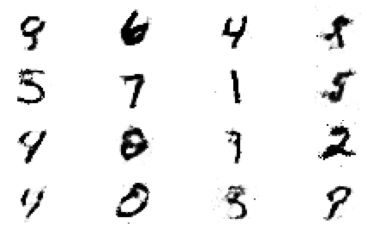

********************************************************************************************************************************** 

epoch -> [81/400], d_loss = 0.012352, g_loss = 0.009696


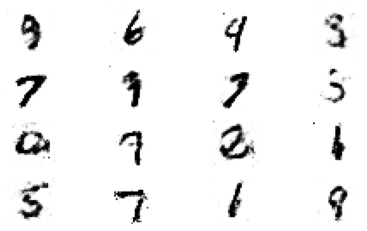

********************************************************************************************************************************** 

epoch -> [82/400], d_loss = 0.012299, g_loss = 0.009783


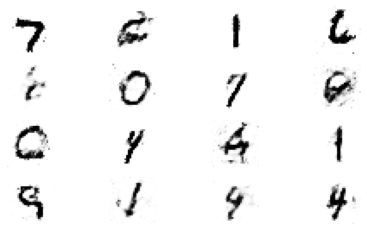

********************************************************************************************************************************** 

epoch -> [83/400], d_loss = 0.012376, g_loss = 0.009771


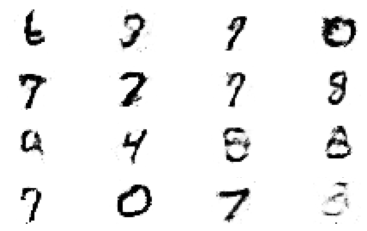

********************************************************************************************************************************** 

epoch -> [84/400], d_loss = 0.012337, g_loss = 0.009741


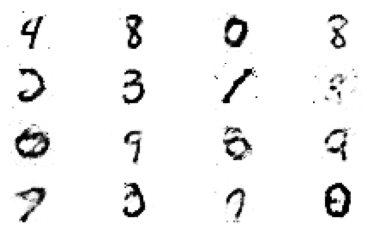

********************************************************************************************************************************** 

epoch -> [85/400], d_loss = 0.012355, g_loss = 0.009659


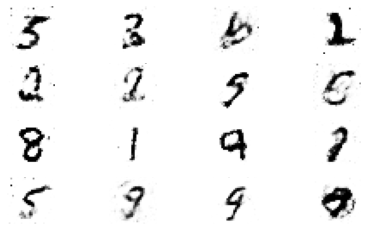

********************************************************************************************************************************** 

epoch -> [86/400], d_loss = 0.012455, g_loss = 0.009482


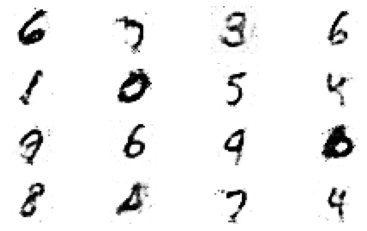

********************************************************************************************************************************** 

epoch -> [87/400], d_loss = 0.012406, g_loss = 0.009681


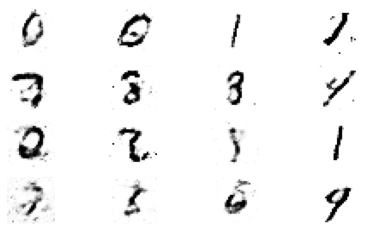

********************************************************************************************************************************** 

epoch -> [88/400], d_loss = 0.012393, g_loss = 0.009633


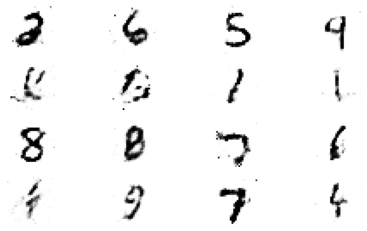

********************************************************************************************************************************** 

epoch -> [89/400], d_loss = 0.012409, g_loss = 0.009657


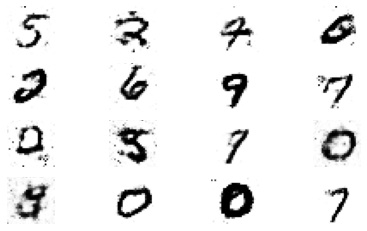

********************************************************************************************************************************** 

epoch -> [90/400], d_loss = 0.012476, g_loss = 0.009399


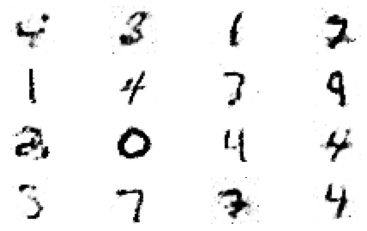

********************************************************************************************************************************** 

epoch -> [91/400], d_loss = 0.012533, g_loss = 0.009366


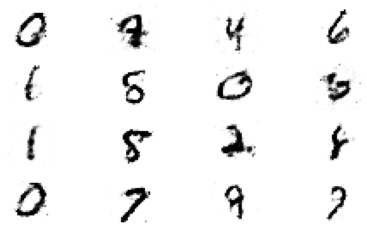

********************************************************************************************************************************** 

epoch -> [92/400], d_loss = 0.012492, g_loss = 0.009512


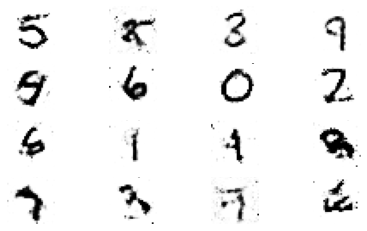

********************************************************************************************************************************** 

epoch -> [93/400], d_loss = 0.012518, g_loss = 0.009518


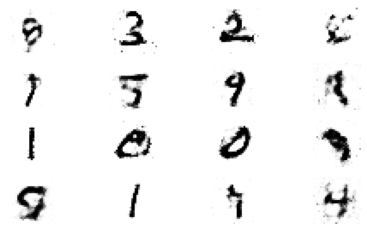

********************************************************************************************************************************** 

epoch -> [94/400], d_loss = 0.012441, g_loss = 0.009532


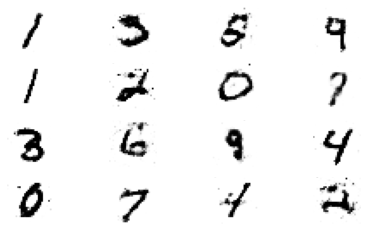

********************************************************************************************************************************** 

epoch -> [95/400], d_loss = 0.012469, g_loss = 0.009432


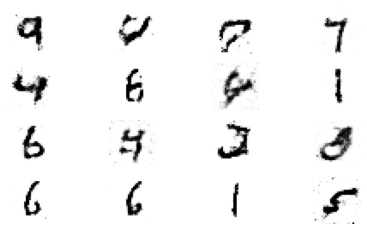

********************************************************************************************************************************** 

epoch -> [96/400], d_loss = 0.012469, g_loss = 0.009476


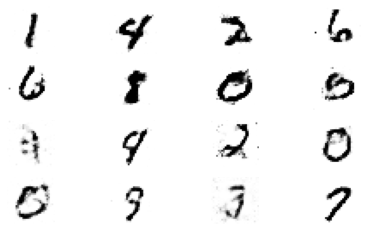

********************************************************************************************************************************** 

epoch -> [97/400], d_loss = 0.012580, g_loss = 0.009298


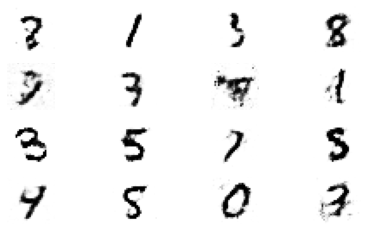

********************************************************************************************************************************** 

epoch -> [98/400], d_loss = 0.012495, g_loss = 0.009492


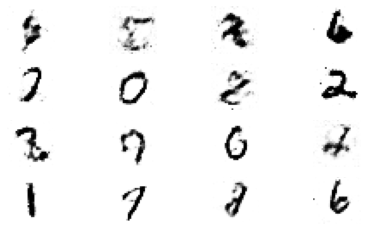

********************************************************************************************************************************** 

epoch -> [99/400], d_loss = 0.012560, g_loss = 0.009363


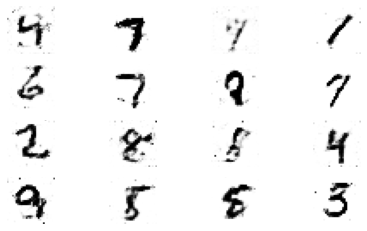

********************************************************************************************************************************** 

epoch -> [100/400], d_loss = 0.012598, g_loss = 0.009269


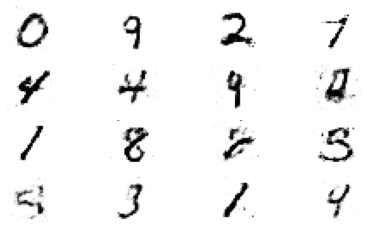

********************************************************************************************************************************** 

epoch -> [101/400], d_loss = 0.012527, g_loss = 0.009384


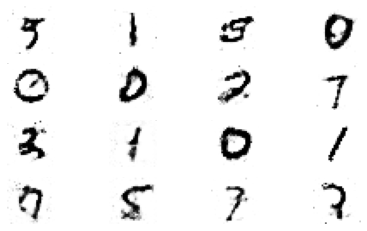

********************************************************************************************************************************** 

epoch -> [102/400], d_loss = 0.012545, g_loss = 0.009328


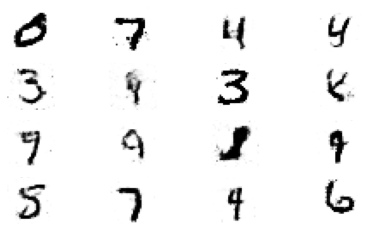

********************************************************************************************************************************** 

epoch -> [103/400], d_loss = 0.012485, g_loss = 0.009487


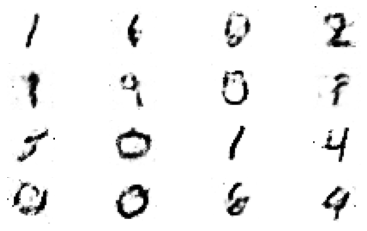

********************************************************************************************************************************** 

epoch -> [104/400], d_loss = 0.012610, g_loss = 0.009151


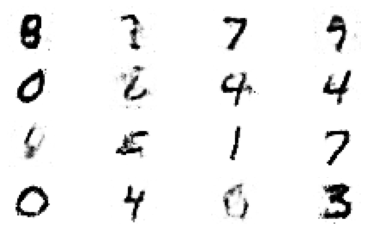

********************************************************************************************************************************** 

epoch -> [105/400], d_loss = 0.012628, g_loss = 0.009226


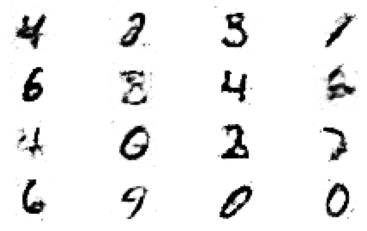

********************************************************************************************************************************** 

epoch -> [106/400], d_loss = 0.012623, g_loss = 0.009159


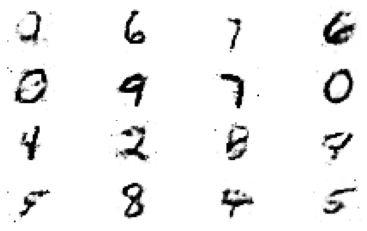

********************************************************************************************************************************** 

epoch -> [107/400], d_loss = 0.012507, g_loss = 0.009347


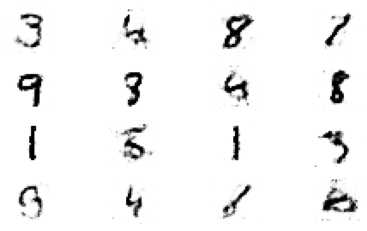

********************************************************************************************************************************** 

epoch -> [108/400], d_loss = 0.012564, g_loss = 0.009311


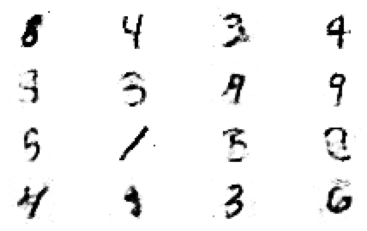

********************************************************************************************************************************** 

epoch -> [109/400], d_loss = 0.012592, g_loss = 0.009297


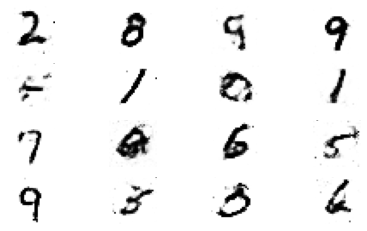

********************************************************************************************************************************** 

epoch -> [110/400], d_loss = 0.012611, g_loss = 0.009238


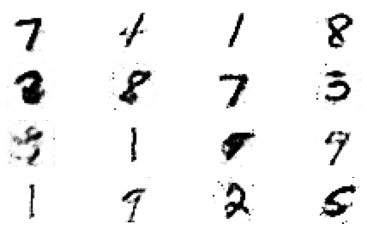

********************************************************************************************************************************** 

epoch -> [111/400], d_loss = 0.012659, g_loss = 0.009237


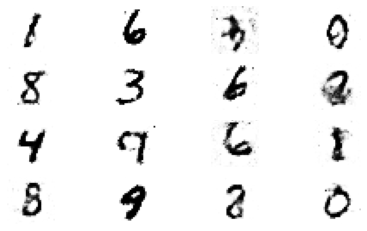

********************************************************************************************************************************** 

epoch -> [112/400], d_loss = 0.012617, g_loss = 0.009229


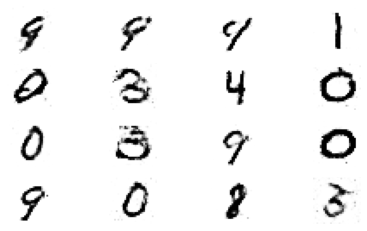

********************************************************************************************************************************** 

epoch -> [113/400], d_loss = 0.012632, g_loss = 0.009261


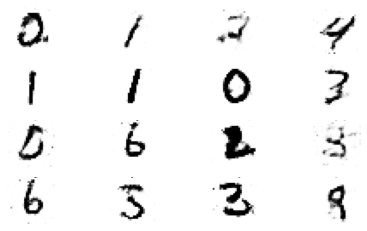

********************************************************************************************************************************** 

epoch -> [114/400], d_loss = 0.012567, g_loss = 0.009285


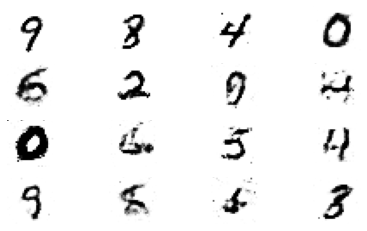

********************************************************************************************************************************** 

epoch -> [115/400], d_loss = 0.012674, g_loss = 0.009127


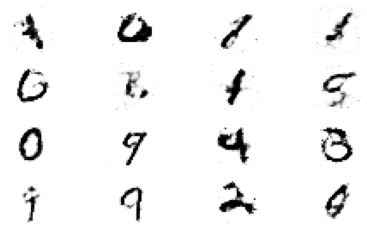

********************************************************************************************************************************** 

epoch -> [116/400], d_loss = 0.012627, g_loss = 0.009122


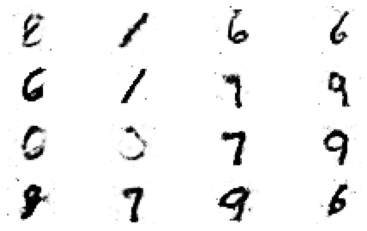

********************************************************************************************************************************** 

epoch -> [117/400], d_loss = 0.012659, g_loss = 0.009135


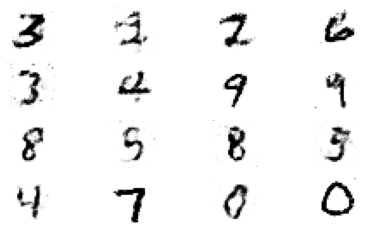

********************************************************************************************************************************** 

epoch -> [118/400], d_loss = 0.012659, g_loss = 0.009150


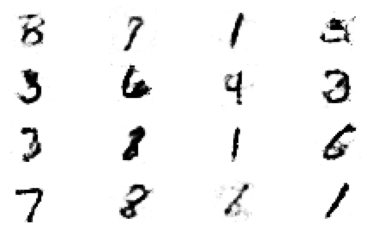

********************************************************************************************************************************** 

epoch -> [119/400], d_loss = 0.012676, g_loss = 0.009181


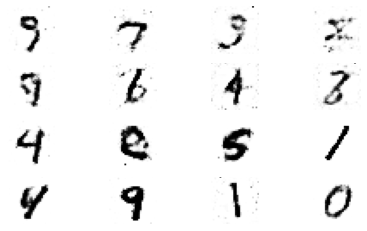

********************************************************************************************************************************** 

epoch -> [120/400], d_loss = 0.012692, g_loss = 0.009019


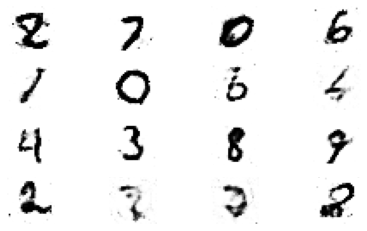

********************************************************************************************************************************** 

epoch -> [121/400], d_loss = 0.012683, g_loss = 0.009179


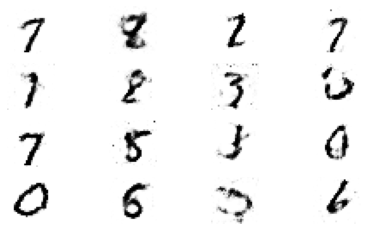

********************************************************************************************************************************** 

epoch -> [122/400], d_loss = 0.012601, g_loss = 0.009227


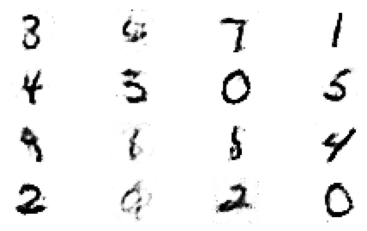

********************************************************************************************************************************** 

epoch -> [123/400], d_loss = 0.012666, g_loss = 0.009076


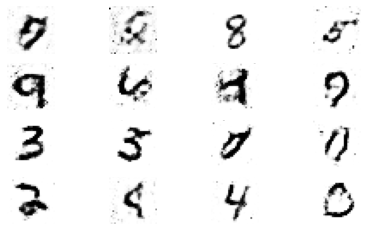

********************************************************************************************************************************** 

epoch -> [124/400], d_loss = 0.012694, g_loss = 0.009135


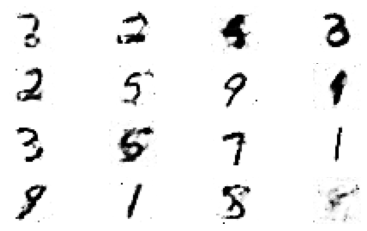

********************************************************************************************************************************** 

epoch -> [125/400], d_loss = 0.012619, g_loss = 0.009272


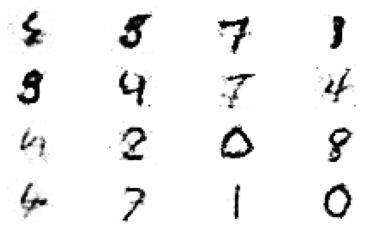

********************************************************************************************************************************** 

epoch -> [126/400], d_loss = 0.012675, g_loss = 0.009170


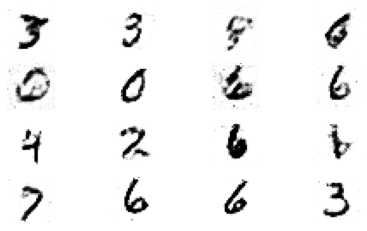

********************************************************************************************************************************** 

epoch -> [127/400], d_loss = 0.012668, g_loss = 0.009088


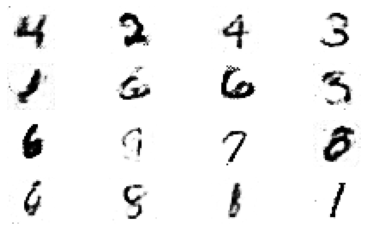

********************************************************************************************************************************** 

epoch -> [128/400], d_loss = 0.012661, g_loss = 0.009132


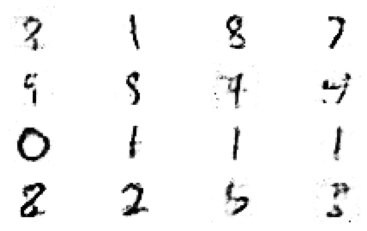

********************************************************************************************************************************** 

epoch -> [129/400], d_loss = 0.012751, g_loss = 0.009096


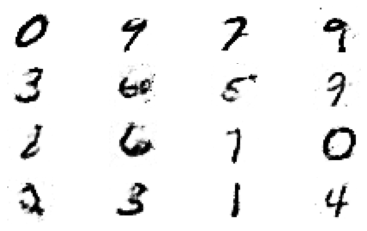

********************************************************************************************************************************** 

epoch -> [130/400], d_loss = 0.012668, g_loss = 0.009100


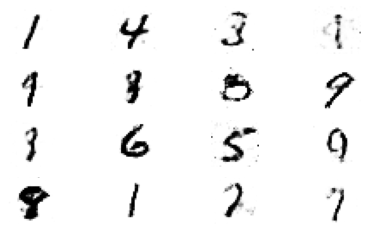

********************************************************************************************************************************** 

epoch -> [131/400], d_loss = 0.012719, g_loss = 0.009025


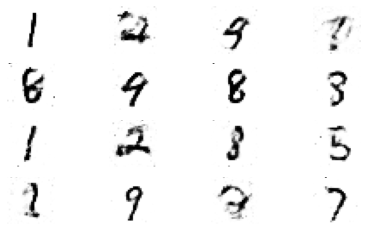

********************************************************************************************************************************** 

epoch -> [132/400], d_loss = 0.012710, g_loss = 0.009012


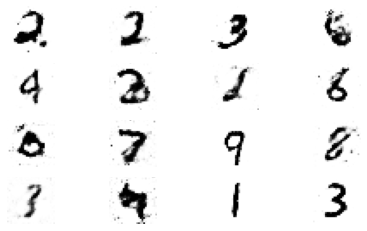

********************************************************************************************************************************** 

epoch -> [133/400], d_loss = 0.012754, g_loss = 0.008940


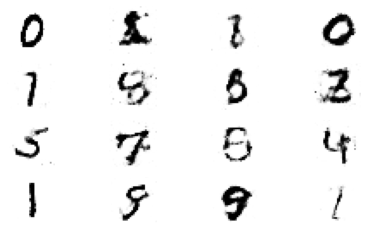

********************************************************************************************************************************** 

epoch -> [134/400], d_loss = 0.012683, g_loss = 0.009201


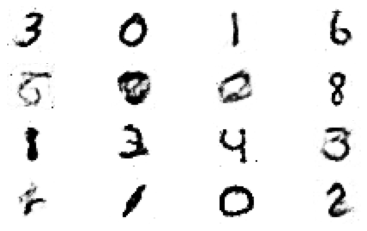

********************************************************************************************************************************** 

epoch -> [135/400], d_loss = 0.012692, g_loss = 0.009040


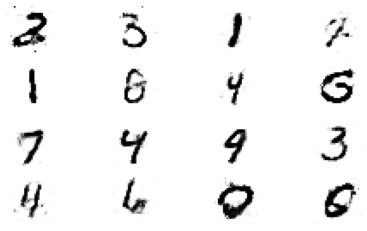

********************************************************************************************************************************** 

epoch -> [136/400], d_loss = 0.012693, g_loss = 0.009096


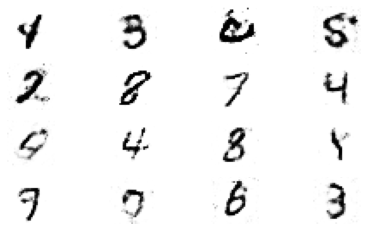

********************************************************************************************************************************** 

epoch -> [137/400], d_loss = 0.012742, g_loss = 0.008953


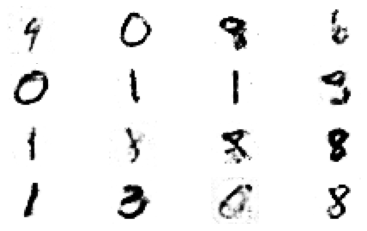

********************************************************************************************************************************** 

epoch -> [138/400], d_loss = 0.012705, g_loss = 0.008987


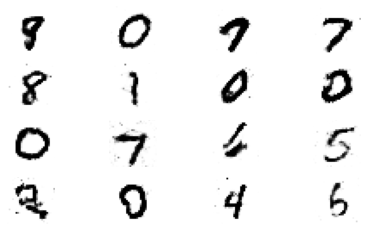

********************************************************************************************************************************** 

epoch -> [139/400], d_loss = 0.012670, g_loss = 0.009098


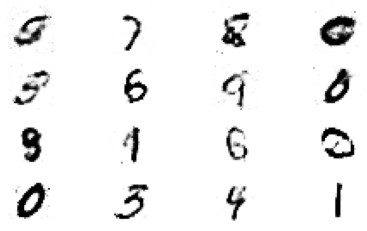

********************************************************************************************************************************** 

epoch -> [140/400], d_loss = 0.012713, g_loss = 0.009146


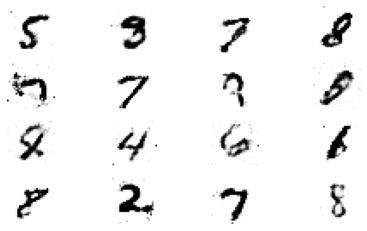

********************************************************************************************************************************** 

epoch -> [141/400], d_loss = 0.012756, g_loss = 0.008993


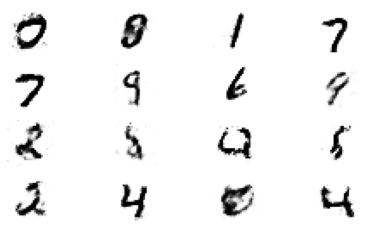

********************************************************************************************************************************** 

epoch -> [142/400], d_loss = 0.012710, g_loss = 0.008962


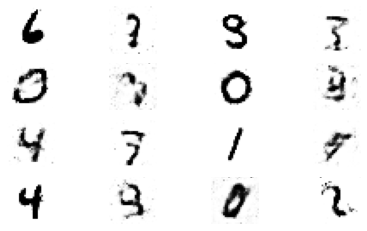

********************************************************************************************************************************** 

epoch -> [143/400], d_loss = 0.012726, g_loss = 0.008994


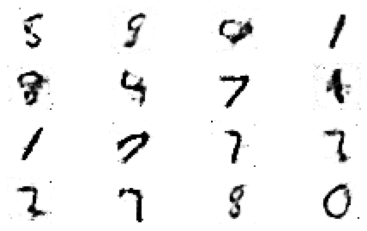

********************************************************************************************************************************** 

epoch -> [144/400], d_loss = 0.012765, g_loss = 0.008882


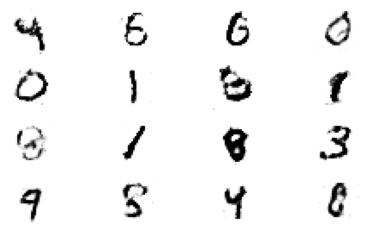

********************************************************************************************************************************** 

epoch -> [145/400], d_loss = 0.012761, g_loss = 0.008870


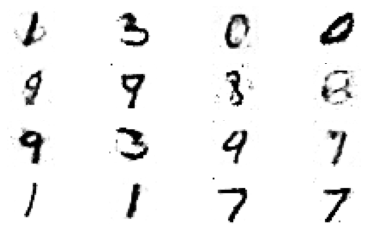

********************************************************************************************************************************** 

epoch -> [146/400], d_loss = 0.012860, g_loss = 0.008821


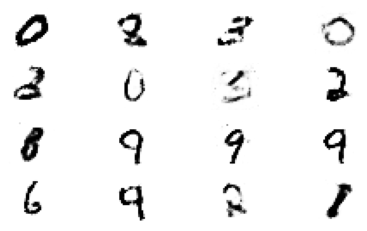

********************************************************************************************************************************** 

epoch -> [147/400], d_loss = 0.012778, g_loss = 0.008951


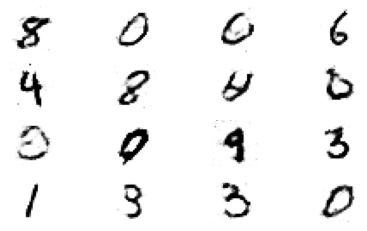

********************************************************************************************************************************** 

epoch -> [148/400], d_loss = 0.012766, g_loss = 0.008900


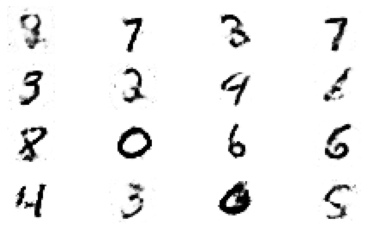

********************************************************************************************************************************** 

epoch -> [149/400], d_loss = 0.012823, g_loss = 0.008841


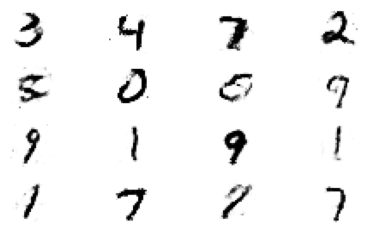

********************************************************************************************************************************** 

epoch -> [150/400], d_loss = 0.012772, g_loss = 0.008976


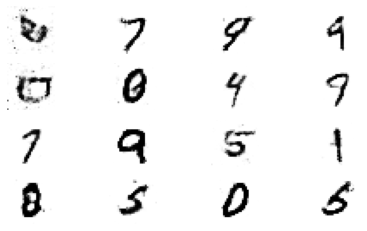

********************************************************************************************************************************** 

epoch -> [151/400], d_loss = 0.012805, g_loss = 0.008848


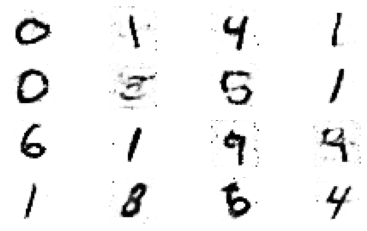

********************************************************************************************************************************** 

epoch -> [152/400], d_loss = 0.012764, g_loss = 0.008890


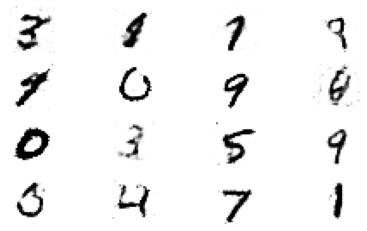

********************************************************************************************************************************** 

epoch -> [153/400], d_loss = 0.012719, g_loss = 0.008982


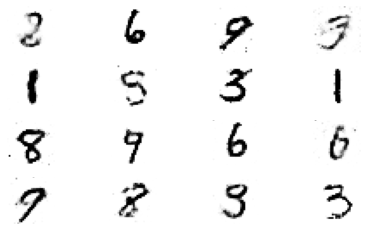

********************************************************************************************************************************** 

epoch -> [154/400], d_loss = 0.012754, g_loss = 0.008979


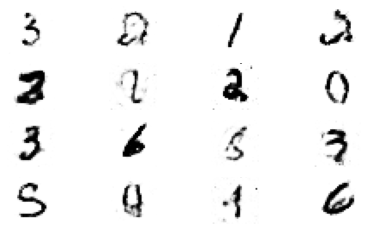

********************************************************************************************************************************** 

epoch -> [155/400], d_loss = 0.012800, g_loss = 0.008865


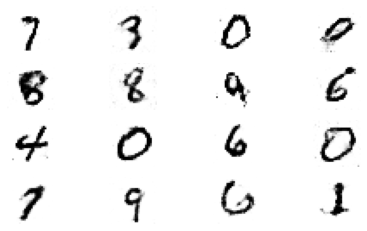

********************************************************************************************************************************** 

epoch -> [156/400], d_loss = 0.012758, g_loss = 0.008904


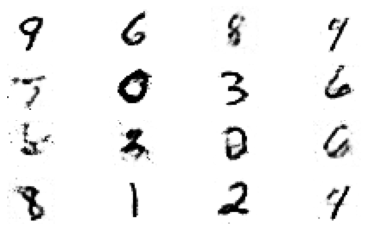

********************************************************************************************************************************** 

epoch -> [157/400], d_loss = 0.012822, g_loss = 0.008895


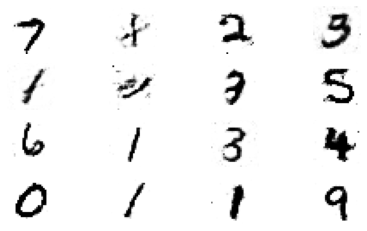

********************************************************************************************************************************** 

epoch -> [158/400], d_loss = 0.012818, g_loss = 0.008837


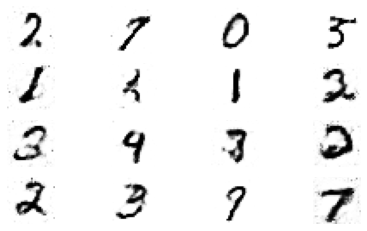

********************************************************************************************************************************** 

epoch -> [159/400], d_loss = 0.012806, g_loss = 0.008840


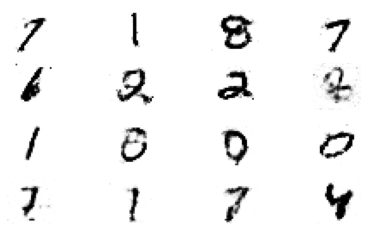

********************************************************************************************************************************** 

epoch -> [160/400], d_loss = 0.012817, g_loss = 0.008866


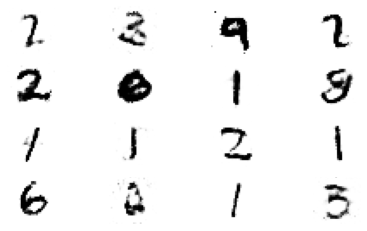

********************************************************************************************************************************** 

epoch -> [161/400], d_loss = 0.012834, g_loss = 0.008820


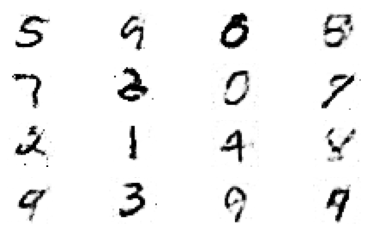

********************************************************************************************************************************** 

epoch -> [162/400], d_loss = 0.012796, g_loss = 0.008867


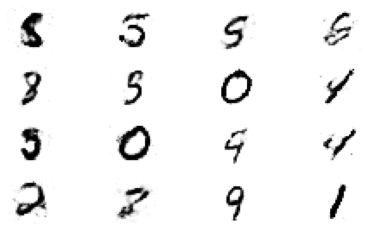

********************************************************************************************************************************** 

epoch -> [163/400], d_loss = 0.012788, g_loss = 0.008887


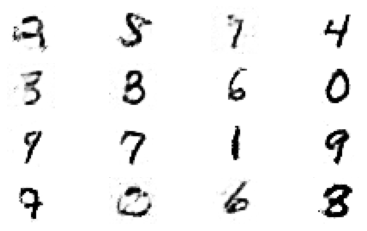

********************************************************************************************************************************** 

epoch -> [164/400], d_loss = 0.012855, g_loss = 0.008911


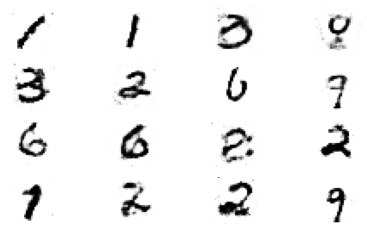

********************************************************************************************************************************** 

epoch -> [165/400], d_loss = 0.012823, g_loss = 0.008835


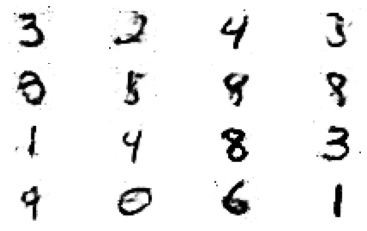

********************************************************************************************************************************** 

epoch -> [166/400], d_loss = 0.012774, g_loss = 0.008966


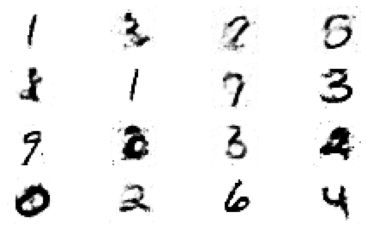

********************************************************************************************************************************** 

epoch -> [167/400], d_loss = 0.012862, g_loss = 0.008742


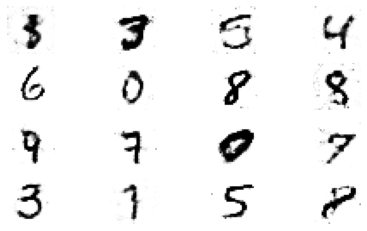

********************************************************************************************************************************** 

epoch -> [168/400], d_loss = 0.012844, g_loss = 0.008830


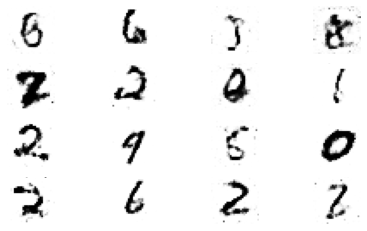

********************************************************************************************************************************** 

epoch -> [169/400], d_loss = 0.012856, g_loss = 0.008756


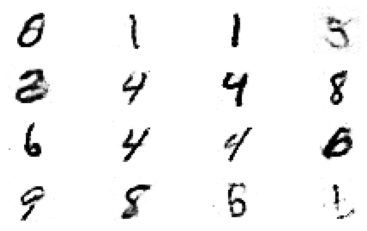

********************************************************************************************************************************** 

epoch -> [170/400], d_loss = 0.012857, g_loss = 0.008720


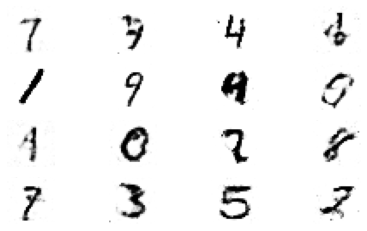

********************************************************************************************************************************** 

epoch -> [171/400], d_loss = 0.012879, g_loss = 0.008741


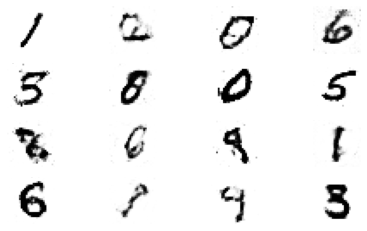

********************************************************************************************************************************** 

epoch -> [172/400], d_loss = 0.012795, g_loss = 0.008986


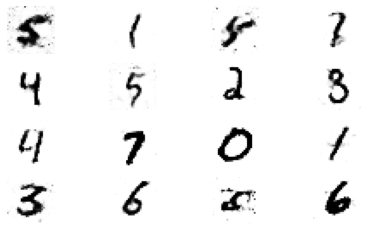

********************************************************************************************************************************** 

epoch -> [173/400], d_loss = 0.012787, g_loss = 0.008909


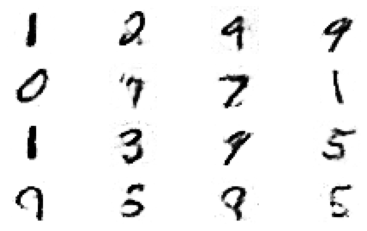

********************************************************************************************************************************** 

epoch -> [174/400], d_loss = 0.012794, g_loss = 0.008876


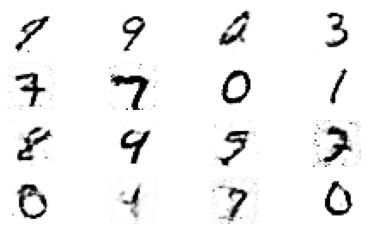

********************************************************************************************************************************** 

epoch -> [175/400], d_loss = 0.012815, g_loss = 0.008815


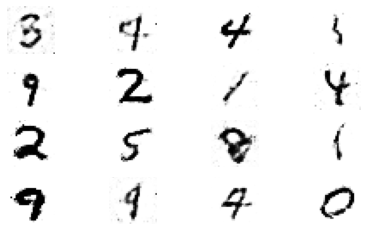

********************************************************************************************************************************** 

epoch -> [176/400], d_loss = 0.012873, g_loss = 0.008775


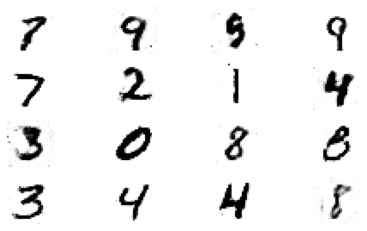

********************************************************************************************************************************** 

epoch -> [177/400], d_loss = 0.012882, g_loss = 0.008699


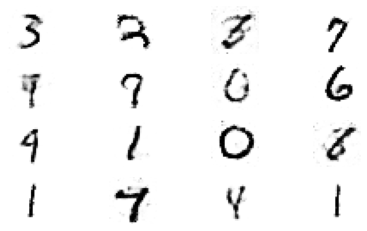

********************************************************************************************************************************** 

epoch -> [178/400], d_loss = 0.012910, g_loss = 0.008676


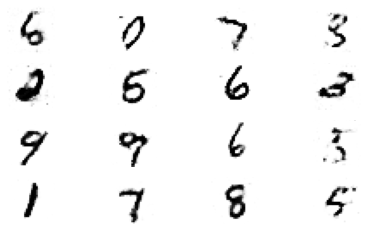

********************************************************************************************************************************** 

epoch -> [179/400], d_loss = 0.012816, g_loss = 0.008872


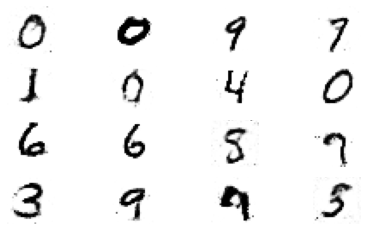

********************************************************************************************************************************** 

epoch -> [180/400], d_loss = 0.012826, g_loss = 0.008807


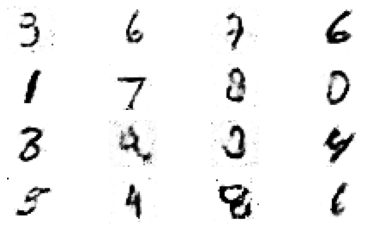

********************************************************************************************************************************** 

epoch -> [181/400], d_loss = 0.012817, g_loss = 0.008825


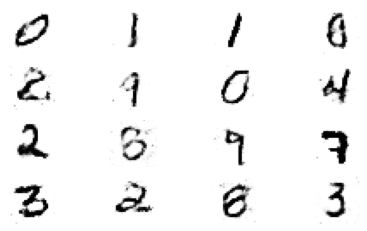

********************************************************************************************************************************** 

epoch -> [182/400], d_loss = 0.012826, g_loss = 0.008908


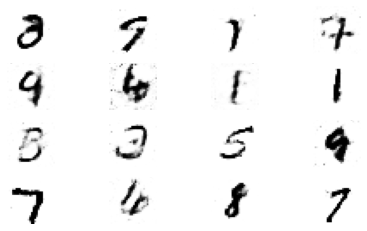

********************************************************************************************************************************** 

epoch -> [183/400], d_loss = 0.012832, g_loss = 0.008868


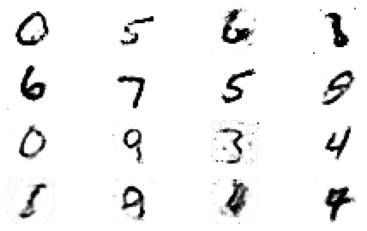

********************************************************************************************************************************** 

epoch -> [184/400], d_loss = 0.012874, g_loss = 0.008671


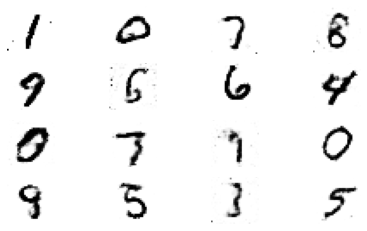

********************************************************************************************************************************** 

epoch -> [185/400], d_loss = 0.012884, g_loss = 0.008717


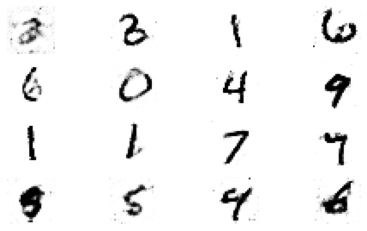

********************************************************************************************************************************** 

epoch -> [186/400], d_loss = 0.012857, g_loss = 0.008812


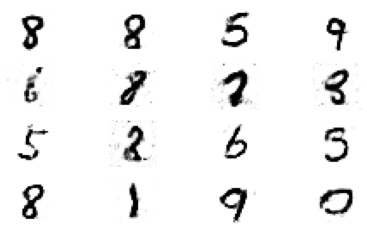

********************************************************************************************************************************** 

epoch -> [187/400], d_loss = 0.012819, g_loss = 0.008848


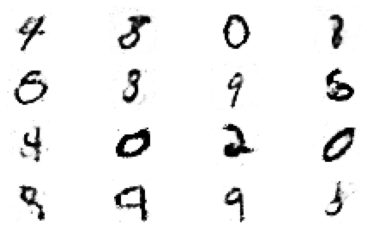

********************************************************************************************************************************** 

epoch -> [188/400], d_loss = 0.012844, g_loss = 0.008769


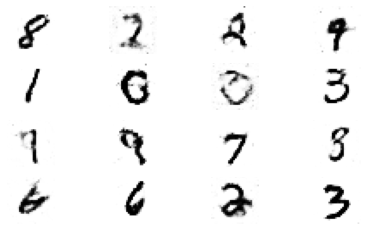

********************************************************************************************************************************** 

epoch -> [189/400], d_loss = 0.012866, g_loss = 0.008763


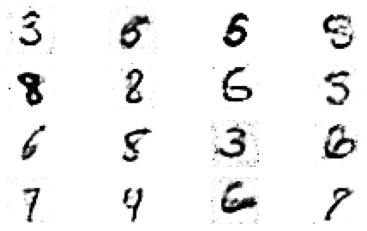

********************************************************************************************************************************** 

epoch -> [190/400], d_loss = 0.012834, g_loss = 0.008848


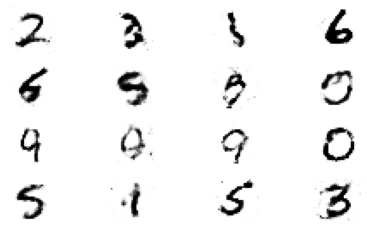

********************************************************************************************************************************** 

epoch -> [191/400], d_loss = 0.012807, g_loss = 0.008838


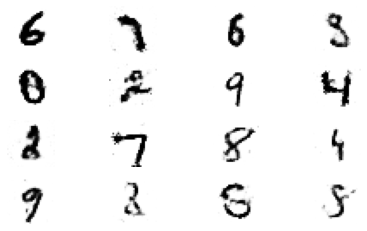

********************************************************************************************************************************** 

epoch -> [192/400], d_loss = 0.012889, g_loss = 0.008736


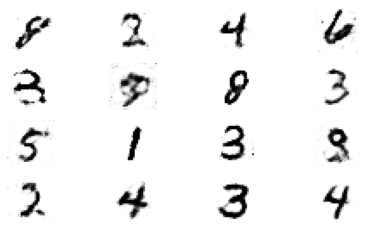

********************************************************************************************************************************** 

epoch -> [193/400], d_loss = 0.012891, g_loss = 0.008780


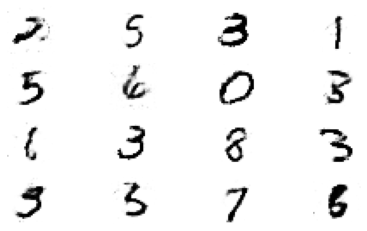

********************************************************************************************************************************** 

epoch -> [194/400], d_loss = 0.012874, g_loss = 0.008790


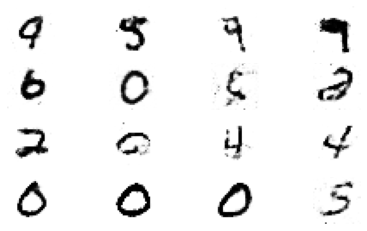

********************************************************************************************************************************** 

epoch -> [195/400], d_loss = 0.012875, g_loss = 0.008740


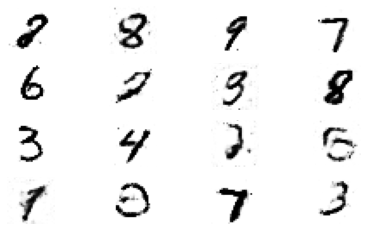

********************************************************************************************************************************** 

epoch -> [196/400], d_loss = 0.012854, g_loss = 0.008714


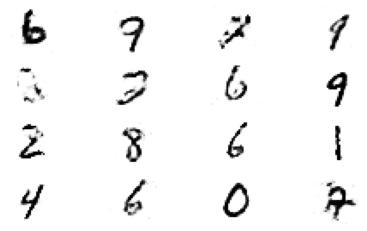

********************************************************************************************************************************** 

epoch -> [197/400], d_loss = 0.012927, g_loss = 0.008611


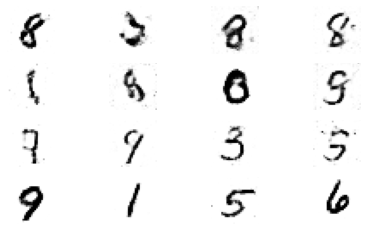

********************************************************************************************************************************** 

epoch -> [198/400], d_loss = 0.012906, g_loss = 0.008715


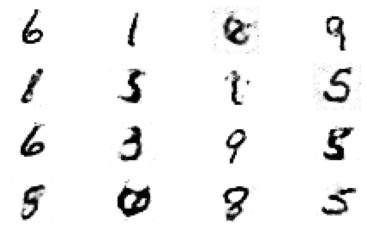

********************************************************************************************************************************** 

epoch -> [199/400], d_loss = 0.012921, g_loss = 0.008688


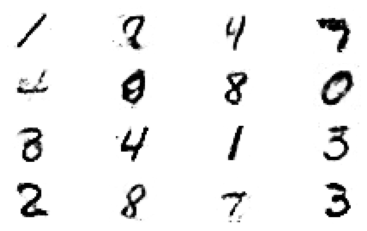

********************************************************************************************************************************** 

epoch -> [200/400], d_loss = 0.012929, g_loss = 0.008629


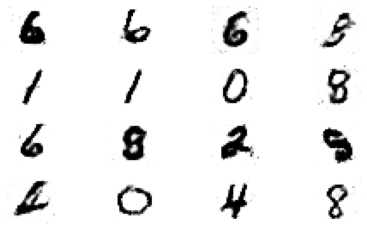

********************************************************************************************************************************** 

epoch -> [201/400], d_loss = 0.012901, g_loss = 0.008784


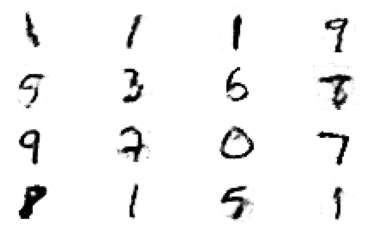

********************************************************************************************************************************** 

epoch -> [202/400], d_loss = 0.012864, g_loss = 0.008758


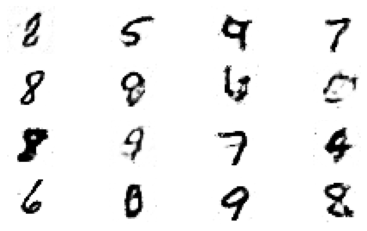

********************************************************************************************************************************** 

epoch -> [203/400], d_loss = 0.012887, g_loss = 0.008681


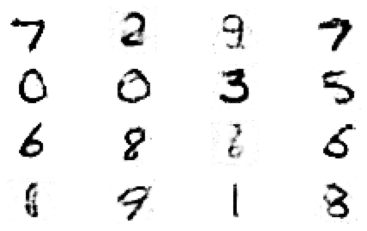

********************************************************************************************************************************** 

epoch -> [204/400], d_loss = 0.012926, g_loss = 0.008708


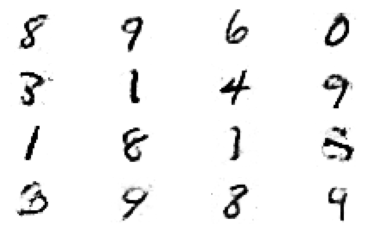

********************************************************************************************************************************** 

epoch -> [205/400], d_loss = 0.012856, g_loss = 0.008815


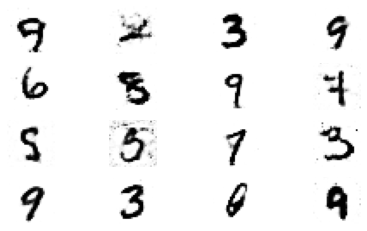

********************************************************************************************************************************** 

epoch -> [206/400], d_loss = 0.012837, g_loss = 0.008869


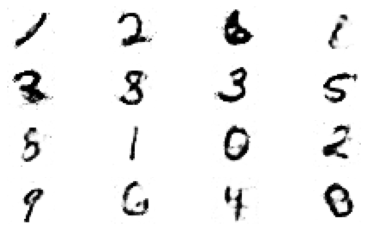

********************************************************************************************************************************** 

epoch -> [207/400], d_loss = 0.012965, g_loss = 0.008600


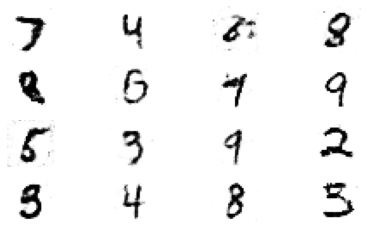

********************************************************************************************************************************** 

epoch -> [208/400], d_loss = 0.012868, g_loss = 0.008746


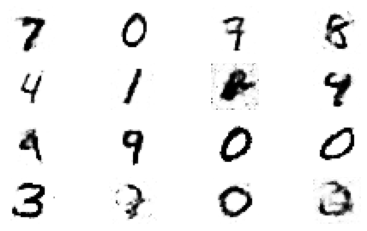

********************************************************************************************************************************** 

epoch -> [209/400], d_loss = 0.012911, g_loss = 0.008678


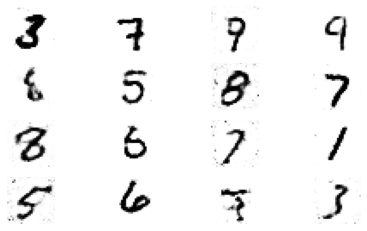

********************************************************************************************************************************** 

epoch -> [210/400], d_loss = 0.012939, g_loss = 0.008700


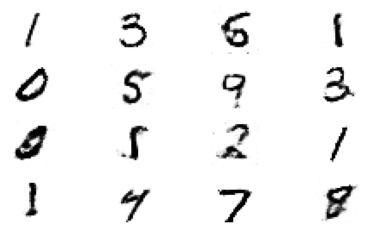

********************************************************************************************************************************** 

epoch -> [211/400], d_loss = 0.012874, g_loss = 0.008667


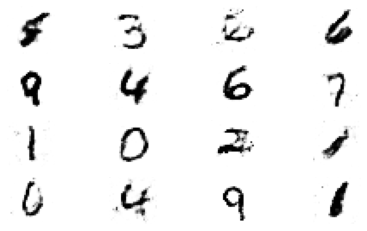

********************************************************************************************************************************** 

epoch -> [212/400], d_loss = 0.012910, g_loss = 0.008682


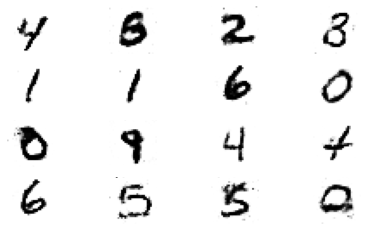

********************************************************************************************************************************** 

epoch -> [213/400], d_loss = 0.012853, g_loss = 0.008721


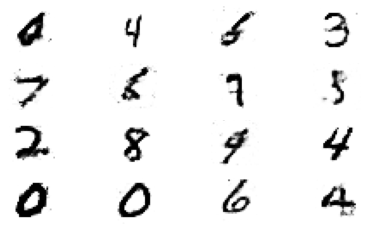

********************************************************************************************************************************** 

epoch -> [214/400], d_loss = 0.012846, g_loss = 0.008853


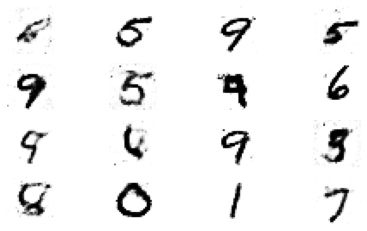

********************************************************************************************************************************** 

epoch -> [215/400], d_loss = 0.012904, g_loss = 0.008617


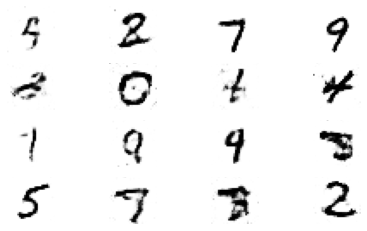

********************************************************************************************************************************** 

epoch -> [216/400], d_loss = 0.012801, g_loss = 0.008835


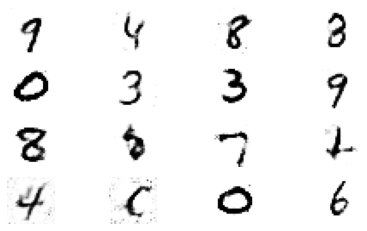

********************************************************************************************************************************** 

epoch -> [217/400], d_loss = 0.012880, g_loss = 0.008801


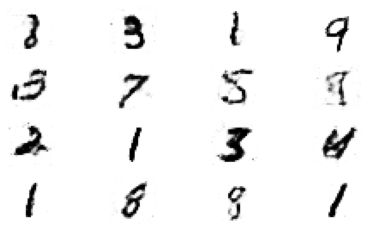

********************************************************************************************************************************** 

epoch -> [218/400], d_loss = 0.012844, g_loss = 0.008733


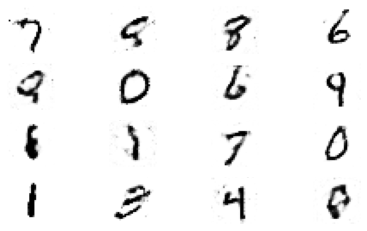

********************************************************************************************************************************** 

epoch -> [219/400], d_loss = 0.012838, g_loss = 0.008760


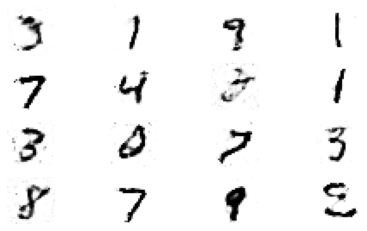

********************************************************************************************************************************** 

epoch -> [220/400], d_loss = 0.012869, g_loss = 0.008723


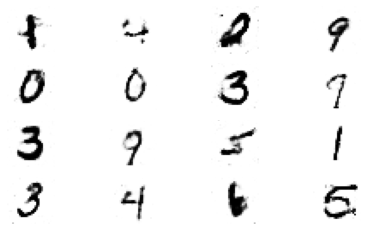

********************************************************************************************************************************** 

epoch -> [221/400], d_loss = 0.012891, g_loss = 0.008705


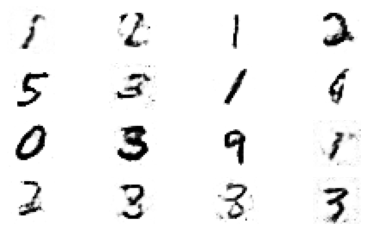

********************************************************************************************************************************** 

epoch -> [222/400], d_loss = 0.012918, g_loss = 0.008609


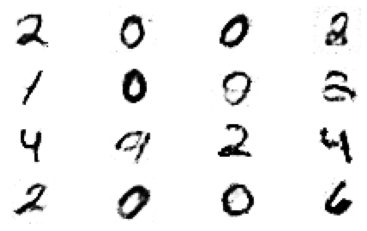

********************************************************************************************************************************** 

epoch -> [223/400], d_loss = 0.012886, g_loss = 0.008667


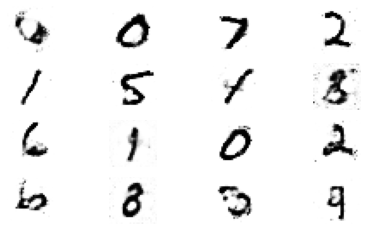

********************************************************************************************************************************** 

epoch -> [224/400], d_loss = 0.012883, g_loss = 0.008767


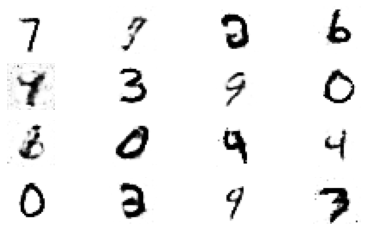

********************************************************************************************************************************** 

epoch -> [225/400], d_loss = 0.012908, g_loss = 0.008652


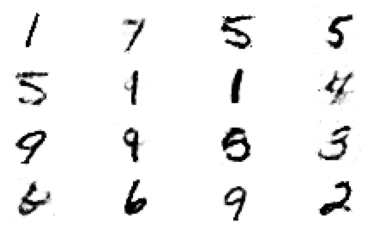

********************************************************************************************************************************** 

epoch -> [226/400], d_loss = 0.012875, g_loss = 0.008769


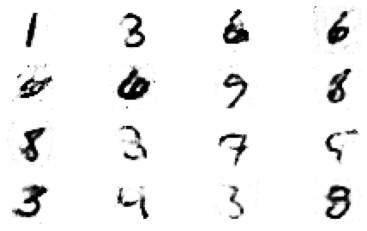

********************************************************************************************************************************** 

epoch -> [227/400], d_loss = 0.012952, g_loss = 0.008601


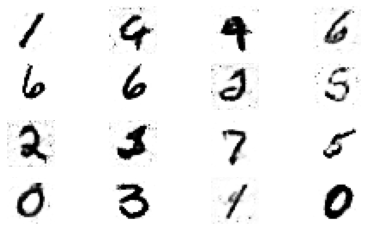

********************************************************************************************************************************** 

epoch -> [228/400], d_loss = 0.012891, g_loss = 0.008741


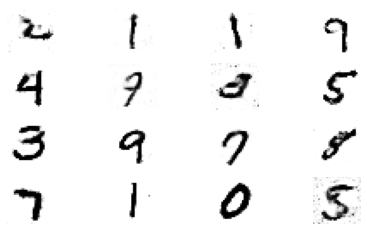

********************************************************************************************************************************** 

epoch -> [229/400], d_loss = 0.012880, g_loss = 0.008701


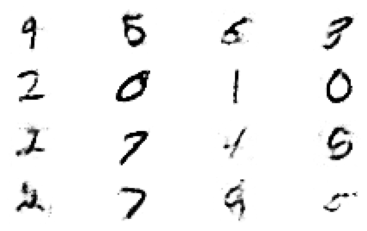

********************************************************************************************************************************** 

epoch -> [230/400], d_loss = 0.012970, g_loss = 0.008560


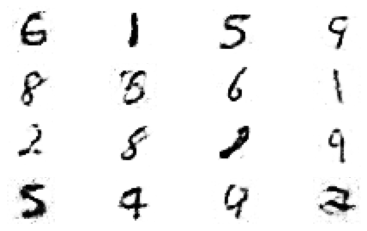

********************************************************************************************************************************** 

epoch -> [231/400], d_loss = 0.012893, g_loss = 0.008733


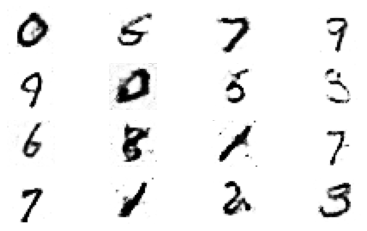

********************************************************************************************************************************** 

epoch -> [232/400], d_loss = 0.012865, g_loss = 0.008756


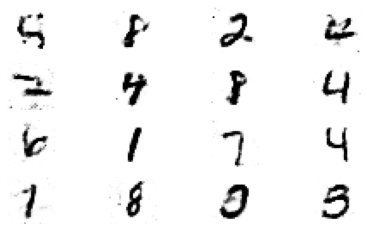

********************************************************************************************************************************** 

epoch -> [233/400], d_loss = 0.012937, g_loss = 0.008600


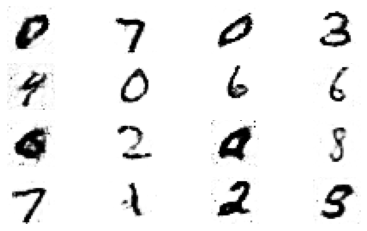

********************************************************************************************************************************** 

epoch -> [234/400], d_loss = 0.012938, g_loss = 0.008652


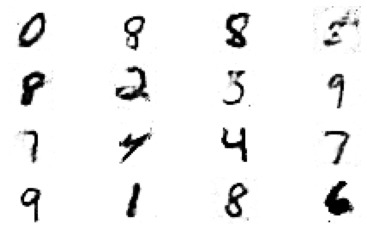

********************************************************************************************************************************** 

epoch -> [235/400], d_loss = 0.012946, g_loss = 0.008654


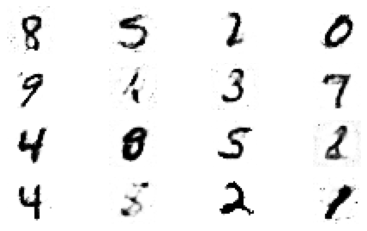

********************************************************************************************************************************** 

epoch -> [236/400], d_loss = 0.012915, g_loss = 0.008653


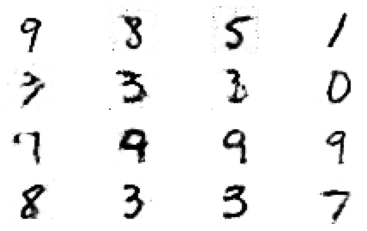

********************************************************************************************************************************** 

epoch -> [237/400], d_loss = 0.012903, g_loss = 0.008622


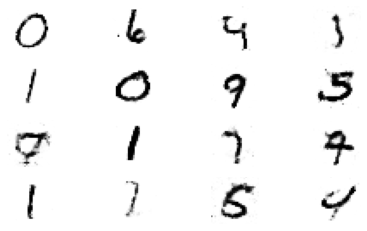

********************************************************************************************************************************** 

epoch -> [238/400], d_loss = 0.012948, g_loss = 0.008670


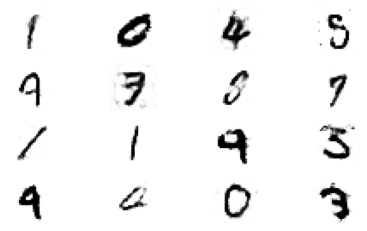

********************************************************************************************************************************** 

epoch -> [239/400], d_loss = 0.012859, g_loss = 0.008719


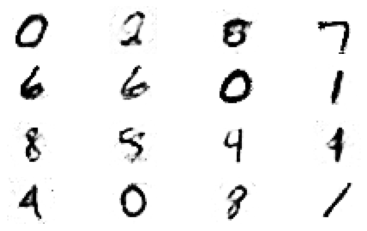

********************************************************************************************************************************** 

epoch -> [240/400], d_loss = 0.012915, g_loss = 0.008673


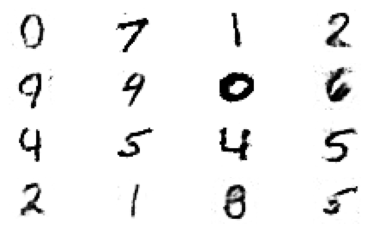

********************************************************************************************************************************** 

epoch -> [241/400], d_loss = 0.012912, g_loss = 0.008793


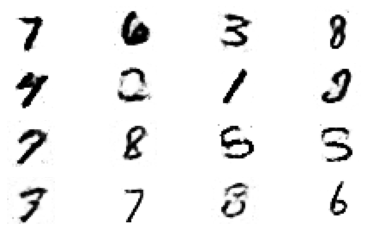

********************************************************************************************************************************** 

epoch -> [242/400], d_loss = 0.012840, g_loss = 0.008795


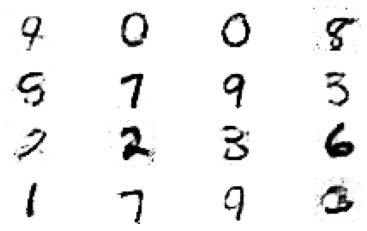

********************************************************************************************************************************** 

epoch -> [243/400], d_loss = 0.012921, g_loss = 0.008619


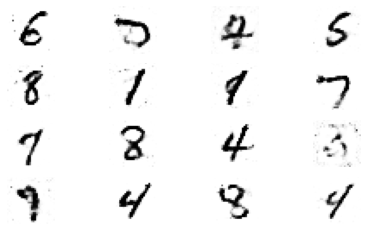

********************************************************************************************************************************** 

epoch -> [244/400], d_loss = 0.012907, g_loss = 0.008750


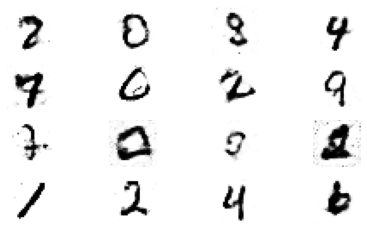

********************************************************************************************************************************** 

epoch -> [245/400], d_loss = 0.012846, g_loss = 0.008865


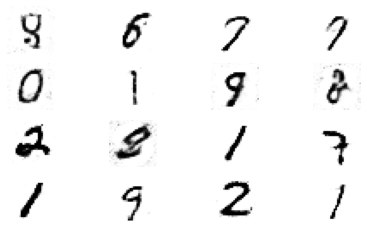

********************************************************************************************************************************** 

epoch -> [246/400], d_loss = 0.012928, g_loss = 0.008636


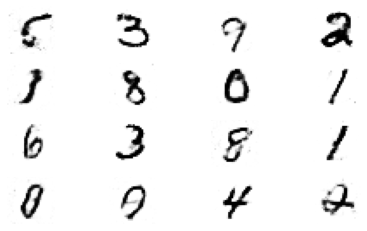

********************************************************************************************************************************** 

epoch -> [247/400], d_loss = 0.012903, g_loss = 0.008638


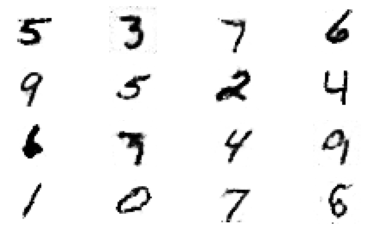

********************************************************************************************************************************** 

epoch -> [248/400], d_loss = 0.012883, g_loss = 0.008724


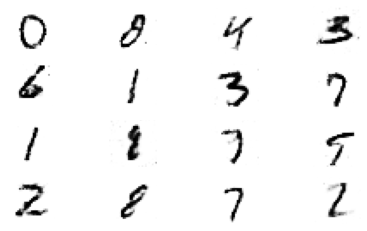

********************************************************************************************************************************** 

epoch -> [249/400], d_loss = 0.012944, g_loss = 0.008593


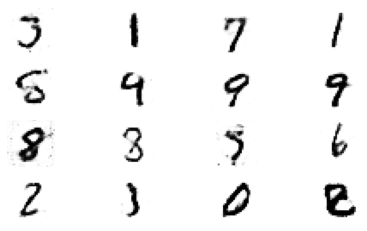

********************************************************************************************************************************** 

epoch -> [250/400], d_loss = 0.012969, g_loss = 0.008443


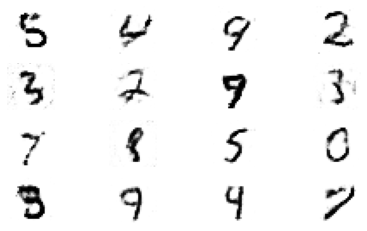

********************************************************************************************************************************** 

epoch -> [251/400], d_loss = 0.012860, g_loss = 0.008811


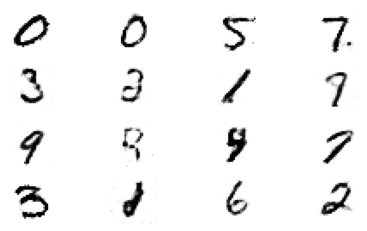

********************************************************************************************************************************** 

epoch -> [252/400], d_loss = 0.012869, g_loss = 0.008728


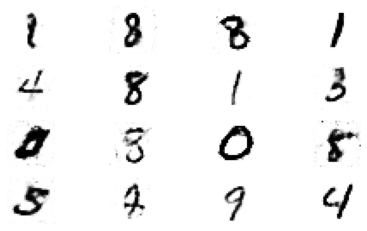

********************************************************************************************************************************** 

epoch -> [253/400], d_loss = 0.012952, g_loss = 0.008625


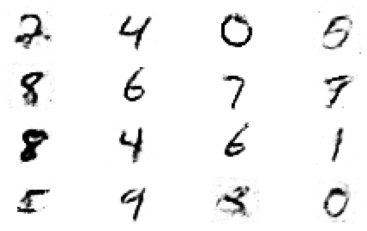

********************************************************************************************************************************** 

epoch -> [254/400], d_loss = 0.012933, g_loss = 0.008662


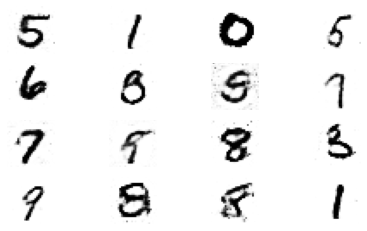

********************************************************************************************************************************** 

epoch -> [255/400], d_loss = 0.012917, g_loss = 0.008661


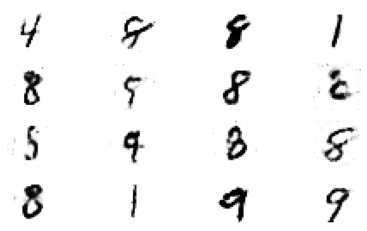

********************************************************************************************************************************** 

epoch -> [256/400], d_loss = 0.012977, g_loss = 0.008557


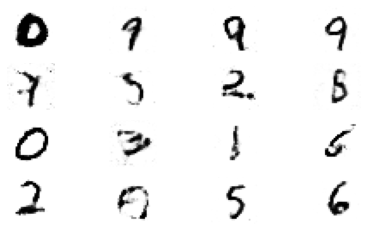

********************************************************************************************************************************** 

epoch -> [257/400], d_loss = 0.012894, g_loss = 0.008764


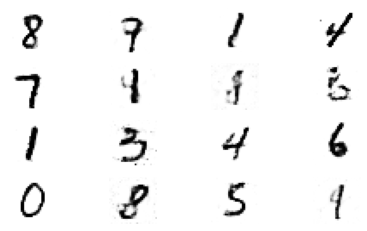

********************************************************************************************************************************** 

epoch -> [258/400], d_loss = 0.012906, g_loss = 0.008656


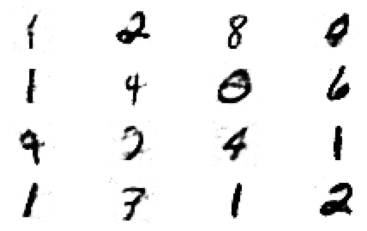

********************************************************************************************************************************** 

epoch -> [259/400], d_loss = 0.012924, g_loss = 0.008658


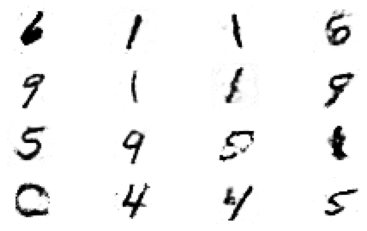

********************************************************************************************************************************** 

epoch -> [260/400], d_loss = 0.012859, g_loss = 0.008691


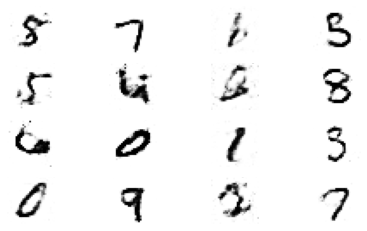

********************************************************************************************************************************** 

epoch -> [261/400], d_loss = 0.012929, g_loss = 0.008627


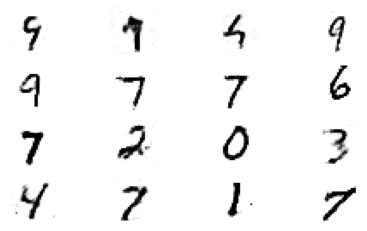

********************************************************************************************************************************** 

epoch -> [262/400], d_loss = 0.012933, g_loss = 0.008706


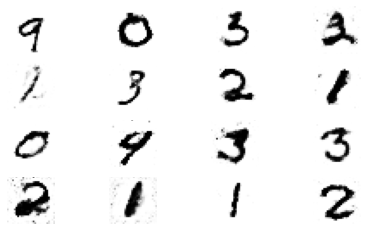

********************************************************************************************************************************** 

epoch -> [263/400], d_loss = 0.012939, g_loss = 0.008633


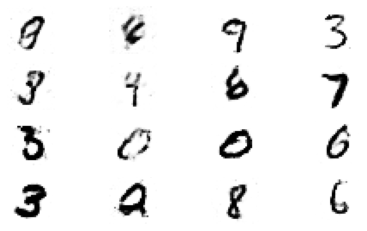

********************************************************************************************************************************** 

epoch -> [264/400], d_loss = 0.012927, g_loss = 0.008659


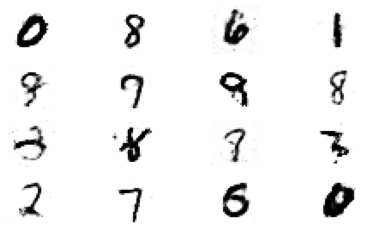

********************************************************************************************************************************** 

epoch -> [265/400], d_loss = 0.012871, g_loss = 0.008796


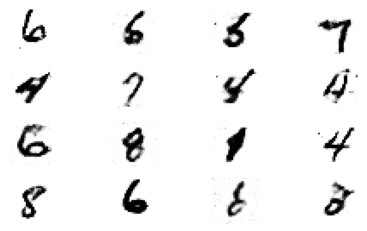

********************************************************************************************************************************** 

epoch -> [266/400], d_loss = 0.012894, g_loss = 0.008672


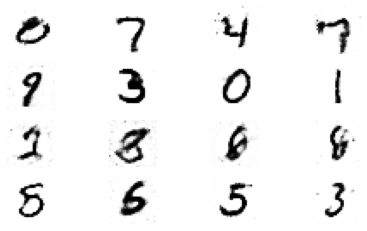

********************************************************************************************************************************** 

epoch -> [267/400], d_loss = 0.012949, g_loss = 0.008575


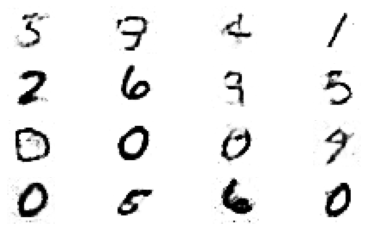

********************************************************************************************************************************** 

epoch -> [268/400], d_loss = 0.012920, g_loss = 0.008650


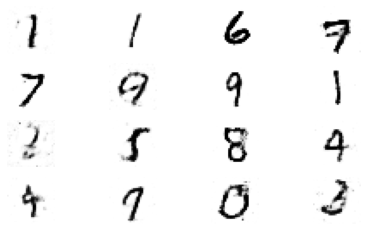

********************************************************************************************************************************** 

epoch -> [269/400], d_loss = 0.012958, g_loss = 0.008547


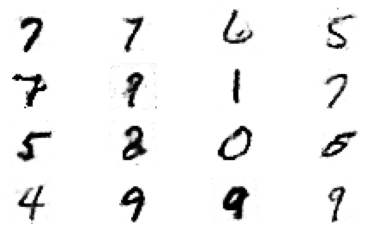

********************************************************************************************************************************** 

epoch -> [270/400], d_loss = 0.012911, g_loss = 0.008693


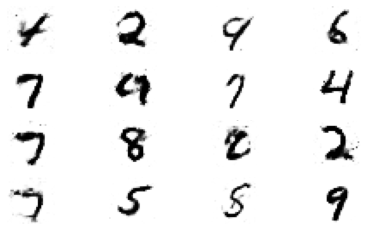

********************************************************************************************************************************** 

epoch -> [271/400], d_loss = 0.012933, g_loss = 0.008734


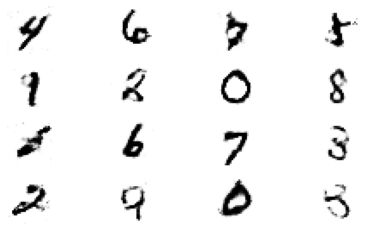

********************************************************************************************************************************** 

epoch -> [272/400], d_loss = 0.012895, g_loss = 0.008746


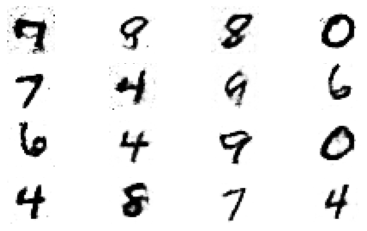

********************************************************************************************************************************** 

epoch -> [273/400], d_loss = 0.012966, g_loss = 0.008550


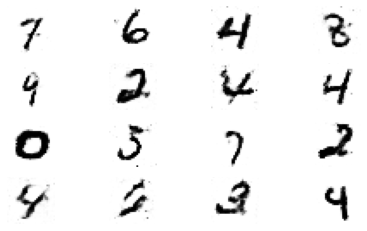

********************************************************************************************************************************** 

epoch -> [274/400], d_loss = 0.012957, g_loss = 0.008559


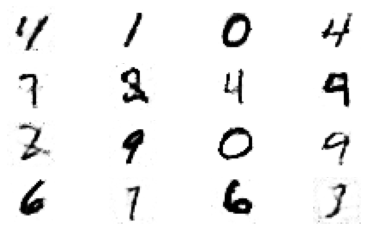

********************************************************************************************************************************** 

epoch -> [275/400], d_loss = 0.012917, g_loss = 0.008700


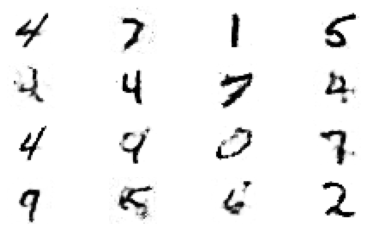

********************************************************************************************************************************** 

epoch -> [276/400], d_loss = 0.012918, g_loss = 0.008684


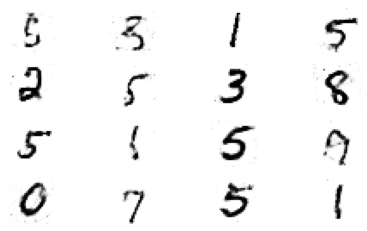

********************************************************************************************************************************** 

epoch -> [277/400], d_loss = 0.012941, g_loss = 0.008605


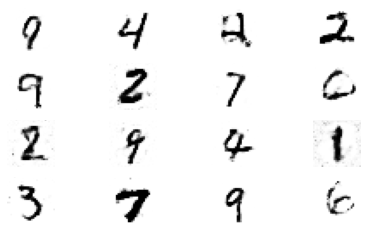

********************************************************************************************************************************** 

epoch -> [278/400], d_loss = 0.012909, g_loss = 0.008635


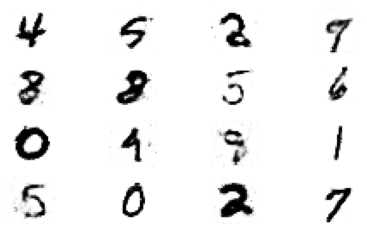

********************************************************************************************************************************** 

epoch -> [279/400], d_loss = 0.012908, g_loss = 0.008715


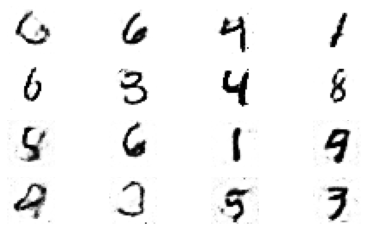

********************************************************************************************************************************** 

epoch -> [280/400], d_loss = 0.012892, g_loss = 0.008729


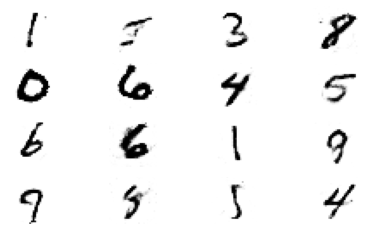

********************************************************************************************************************************** 

epoch -> [281/400], d_loss = 0.012931, g_loss = 0.008624


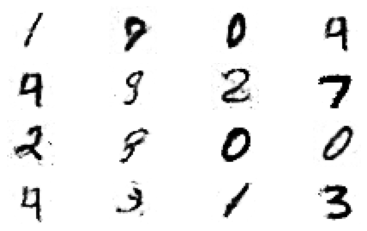

********************************************************************************************************************************** 

epoch -> [282/400], d_loss = 0.012891, g_loss = 0.008641


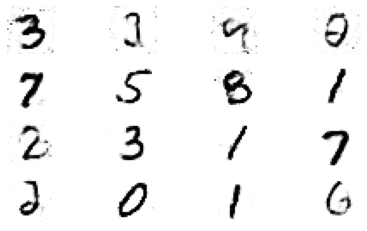

********************************************************************************************************************************** 

epoch -> [283/400], d_loss = 0.012900, g_loss = 0.008633


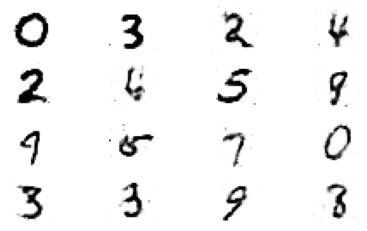

********************************************************************************************************************************** 

epoch -> [284/400], d_loss = 0.012952, g_loss = 0.008544


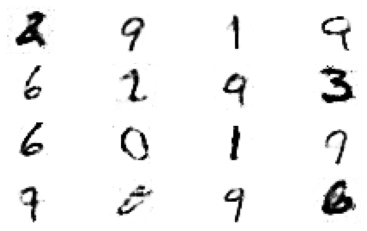

********************************************************************************************************************************** 

epoch -> [285/400], d_loss = 0.012909, g_loss = 0.008759


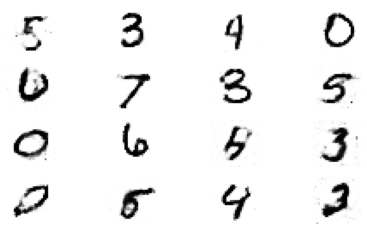

********************************************************************************************************************************** 

epoch -> [286/400], d_loss = 0.012887, g_loss = 0.008721


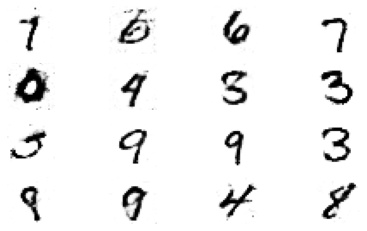

********************************************************************************************************************************** 

epoch -> [287/400], d_loss = 0.012937, g_loss = 0.008628


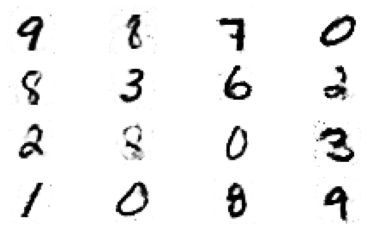

********************************************************************************************************************************** 

epoch -> [288/400], d_loss = 0.012893, g_loss = 0.008689


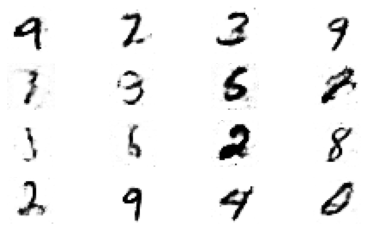

********************************************************************************************************************************** 

epoch -> [289/400], d_loss = 0.012890, g_loss = 0.008675


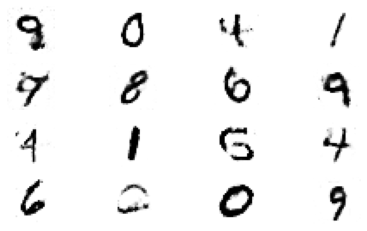

********************************************************************************************************************************** 

epoch -> [290/400], d_loss = 0.012936, g_loss = 0.008626


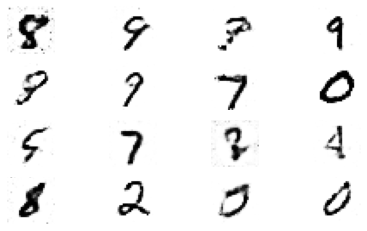

********************************************************************************************************************************** 

epoch -> [291/400], d_loss = 0.012906, g_loss = 0.008671


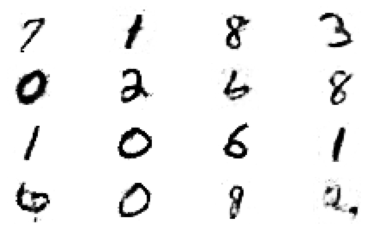

********************************************************************************************************************************** 

epoch -> [292/400], d_loss = 0.012941, g_loss = 0.008667


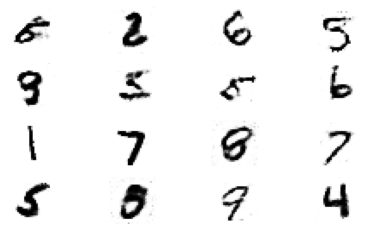

********************************************************************************************************************************** 

epoch -> [293/400], d_loss = 0.012925, g_loss = 0.008661


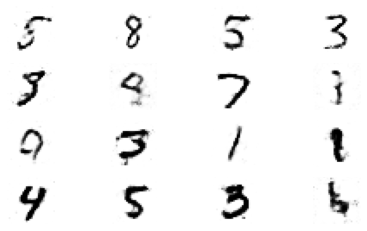

********************************************************************************************************************************** 

epoch -> [294/400], d_loss = 0.012911, g_loss = 0.008643


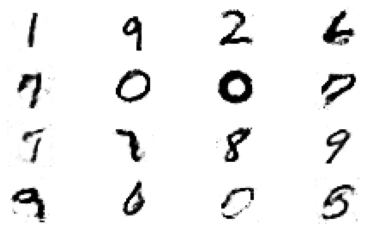

********************************************************************************************************************************** 

epoch -> [295/400], d_loss = 0.012948, g_loss = 0.008575


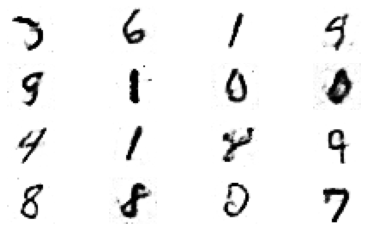

********************************************************************************************************************************** 

epoch -> [296/400], d_loss = 0.012902, g_loss = 0.008674


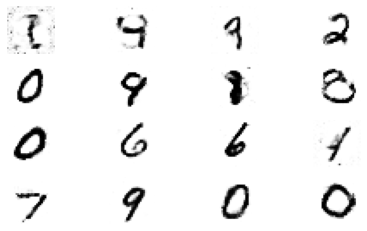

********************************************************************************************************************************** 

epoch -> [297/400], d_loss = 0.012895, g_loss = 0.008698


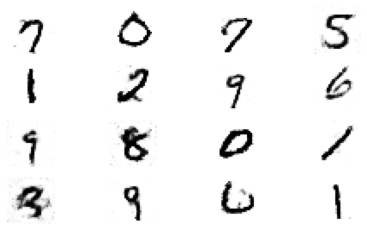

********************************************************************************************************************************** 

epoch -> [298/400], d_loss = 0.012962, g_loss = 0.008552


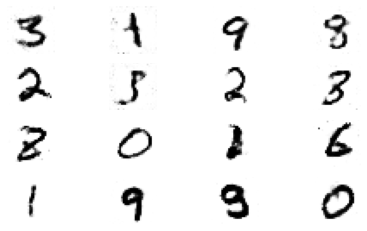

********************************************************************************************************************************** 

epoch -> [299/400], d_loss = 0.012936, g_loss = 0.008664


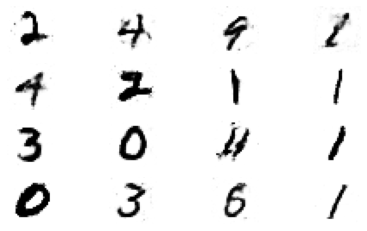

********************************************************************************************************************************** 

epoch -> [300/400], d_loss = 0.012951, g_loss = 0.008672


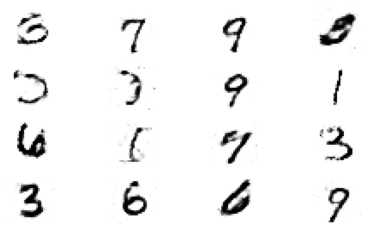

********************************************************************************************************************************** 

epoch -> [301/400], d_loss = 0.012885, g_loss = 0.008726


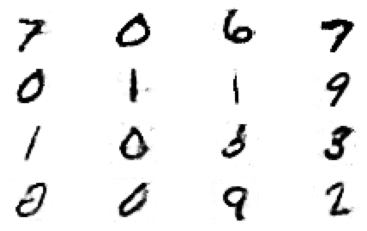

********************************************************************************************************************************** 

epoch -> [302/400], d_loss = 0.012897, g_loss = 0.008698


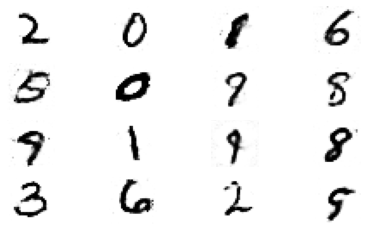

********************************************************************************************************************************** 

epoch -> [303/400], d_loss = 0.012923, g_loss = 0.008636


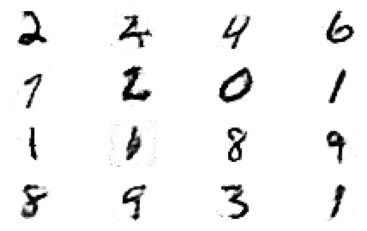

********************************************************************************************************************************** 

epoch -> [304/400], d_loss = 0.012923, g_loss = 0.008643


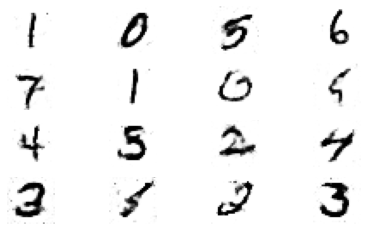

********************************************************************************************************************************** 

epoch -> [305/400], d_loss = 0.012950, g_loss = 0.008583


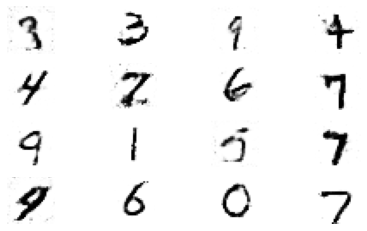

********************************************************************************************************************************** 

epoch -> [306/400], d_loss = 0.012965, g_loss = 0.008604


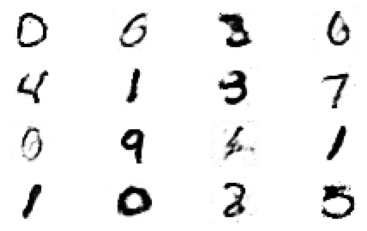

********************************************************************************************************************************** 

epoch -> [307/400], d_loss = 0.012905, g_loss = 0.008670


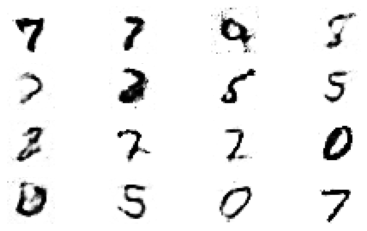

********************************************************************************************************************************** 

epoch -> [308/400], d_loss = 0.012906, g_loss = 0.008623


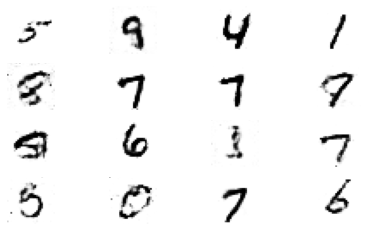

********************************************************************************************************************************** 

epoch -> [309/400], d_loss = 0.012963, g_loss = 0.008550


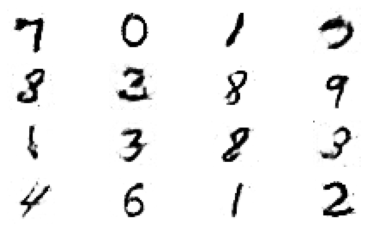

********************************************************************************************************************************** 

epoch -> [310/400], d_loss = 0.012900, g_loss = 0.008695


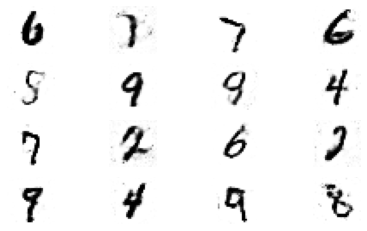

********************************************************************************************************************************** 

epoch -> [311/400], d_loss = 0.012932, g_loss = 0.008631


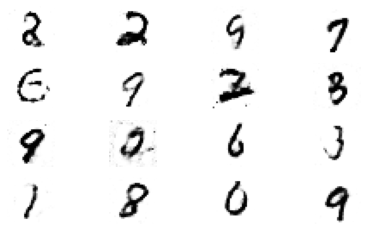

********************************************************************************************************************************** 

epoch -> [312/400], d_loss = 0.012946, g_loss = 0.008674


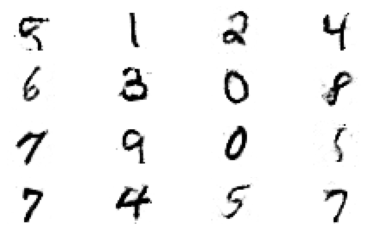

********************************************************************************************************************************** 

epoch -> [313/400], d_loss = 0.012961, g_loss = 0.008549


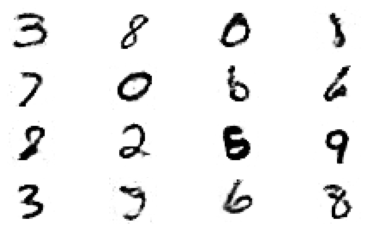

********************************************************************************************************************************** 

epoch -> [314/400], d_loss = 0.012944, g_loss = 0.008640


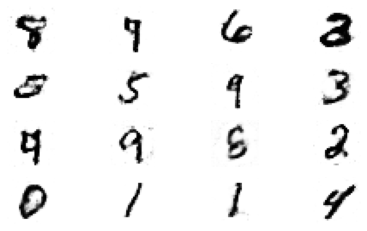

********************************************************************************************************************************** 

epoch -> [315/400], d_loss = 0.012917, g_loss = 0.008651


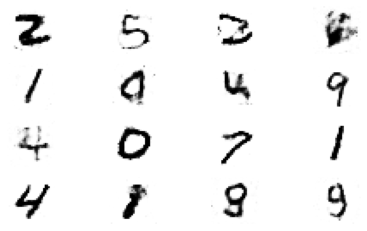

********************************************************************************************************************************** 

epoch -> [316/400], d_loss = 0.012918, g_loss = 0.008637


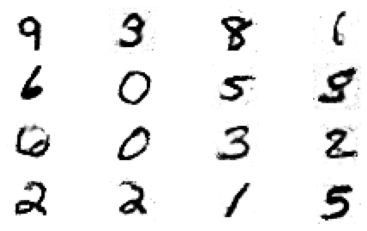

********************************************************************************************************************************** 

epoch -> [317/400], d_loss = 0.012915, g_loss = 0.008695


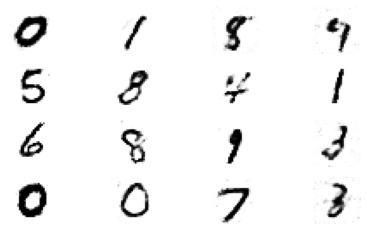

********************************************************************************************************************************** 

epoch -> [318/400], d_loss = 0.012836, g_loss = 0.008738


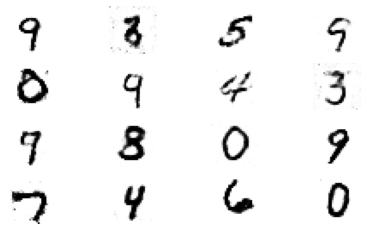

********************************************************************************************************************************** 

epoch -> [319/400], d_loss = 0.012920, g_loss = 0.008633


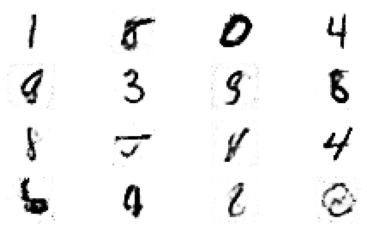

********************************************************************************************************************************** 

epoch -> [320/400], d_loss = 0.012937, g_loss = 0.008601


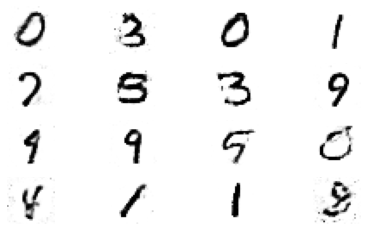

********************************************************************************************************************************** 

epoch -> [321/400], d_loss = 0.013014, g_loss = 0.008472


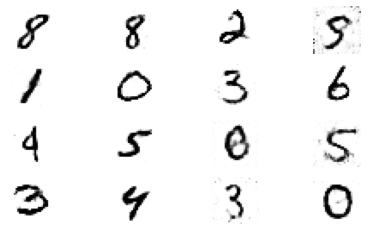

********************************************************************************************************************************** 

epoch -> [322/400], d_loss = 0.012918, g_loss = 0.008660


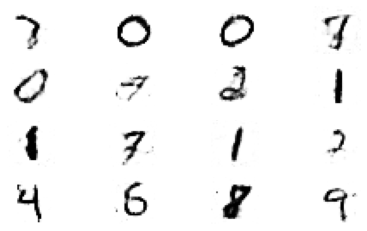

********************************************************************************************************************************** 

epoch -> [323/400], d_loss = 0.012951, g_loss = 0.008558


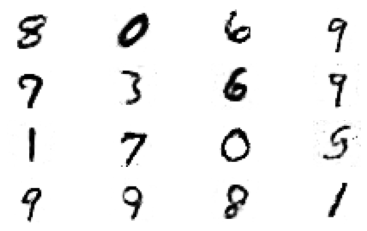

********************************************************************************************************************************** 

epoch -> [324/400], d_loss = 0.012910, g_loss = 0.008606


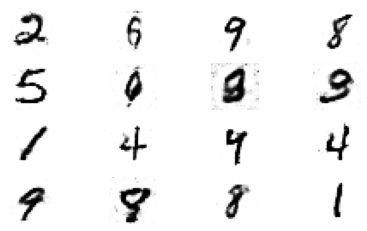

********************************************************************************************************************************** 

epoch -> [325/400], d_loss = 0.012942, g_loss = 0.008556


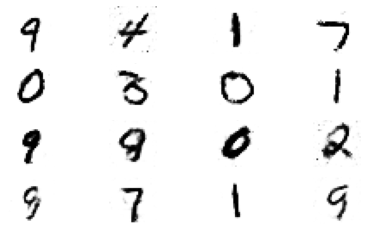

********************************************************************************************************************************** 

epoch -> [326/400], d_loss = 0.012919, g_loss = 0.008677


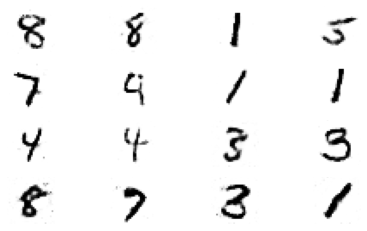

********************************************************************************************************************************** 

epoch -> [327/400], d_loss = 0.012915, g_loss = 0.008651


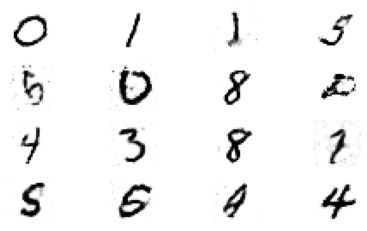

********************************************************************************************************************************** 

epoch -> [328/400], d_loss = 0.012945, g_loss = 0.008582


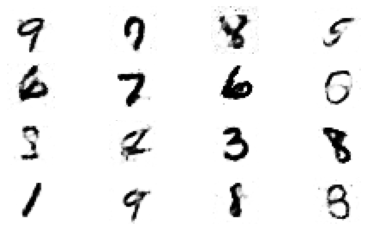

********************************************************************************************************************************** 

epoch -> [329/400], d_loss = 0.012929, g_loss = 0.008594


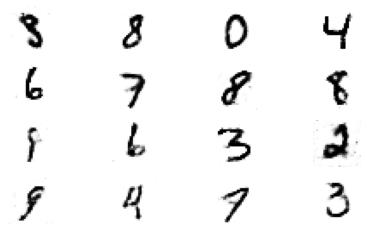

********************************************************************************************************************************** 

epoch -> [330/400], d_loss = 0.012876, g_loss = 0.008778


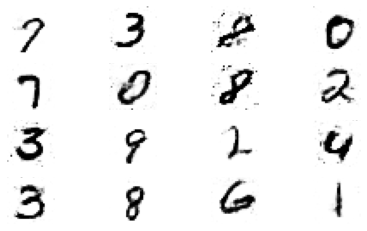

********************************************************************************************************************************** 

epoch -> [331/400], d_loss = 0.012890, g_loss = 0.008758


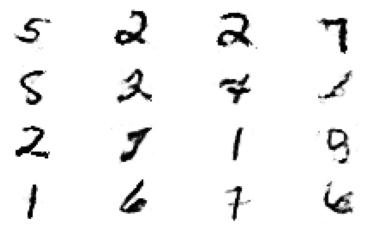

********************************************************************************************************************************** 

epoch -> [332/400], d_loss = 0.012984, g_loss = 0.008504


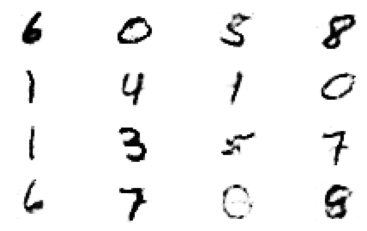

********************************************************************************************************************************** 

epoch -> [333/400], d_loss = 0.012899, g_loss = 0.008699


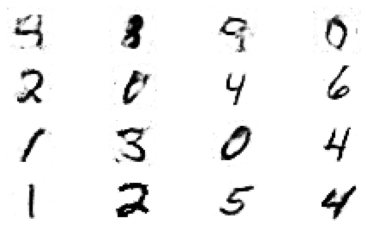

********************************************************************************************************************************** 

epoch -> [334/400], d_loss = 0.012956, g_loss = 0.008553


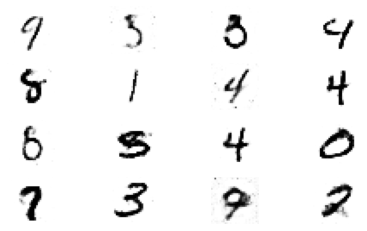

********************************************************************************************************************************** 

epoch -> [335/400], d_loss = 0.012939, g_loss = 0.008569


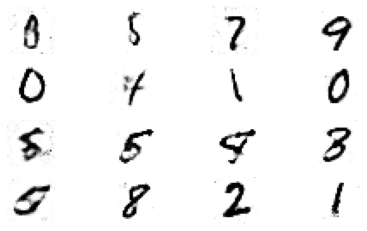

********************************************************************************************************************************** 

epoch -> [336/400], d_loss = 0.012945, g_loss = 0.008636


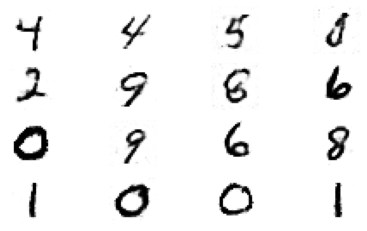

********************************************************************************************************************************** 

epoch -> [337/400], d_loss = 0.012883, g_loss = 0.008675


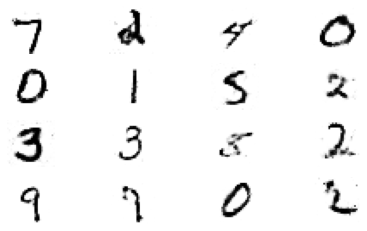

********************************************************************************************************************************** 

epoch -> [338/400], d_loss = 0.012946, g_loss = 0.008607


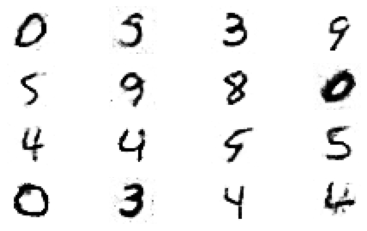

********************************************************************************************************************************** 

epoch -> [339/400], d_loss = 0.012901, g_loss = 0.008711


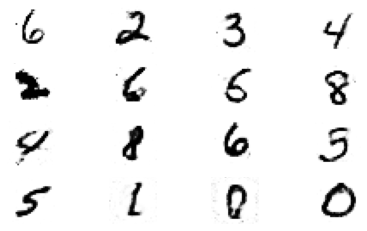

********************************************************************************************************************************** 

epoch -> [340/400], d_loss = 0.012914, g_loss = 0.008656


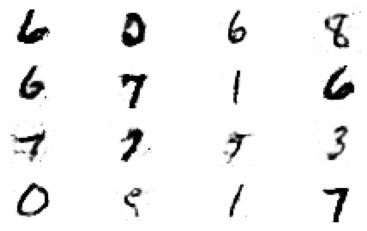

********************************************************************************************************************************** 

epoch -> [341/400], d_loss = 0.012946, g_loss = 0.008589


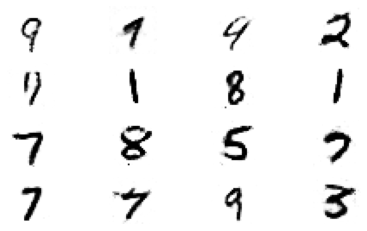

********************************************************************************************************************************** 

epoch -> [342/400], d_loss = 0.012972, g_loss = 0.008540


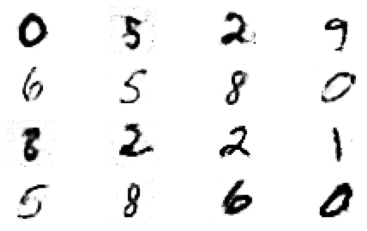

********************************************************************************************************************************** 

epoch -> [343/400], d_loss = 0.012880, g_loss = 0.008678


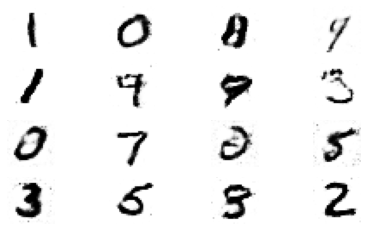

********************************************************************************************************************************** 

epoch -> [344/400], d_loss = 0.012921, g_loss = 0.008651


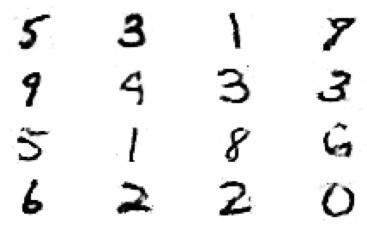

********************************************************************************************************************************** 

epoch -> [345/400], d_loss = 0.012892, g_loss = 0.008735


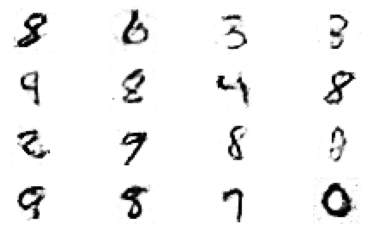

********************************************************************************************************************************** 

epoch -> [346/400], d_loss = 0.012916, g_loss = 0.008578


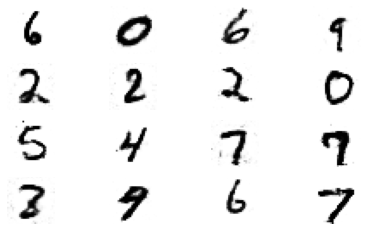

********************************************************************************************************************************** 

epoch -> [347/400], d_loss = 0.012918, g_loss = 0.008662


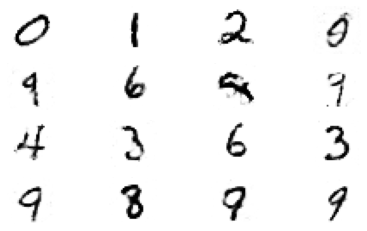

********************************************************************************************************************************** 

epoch -> [348/400], d_loss = 0.012949, g_loss = 0.008585


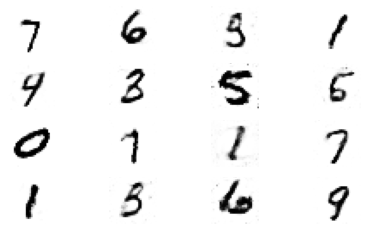

********************************************************************************************************************************** 

epoch -> [349/400], d_loss = 0.012935, g_loss = 0.008613


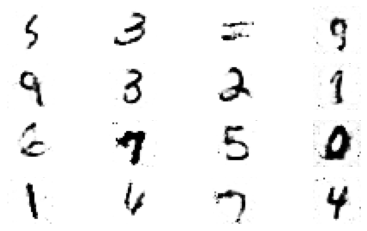

********************************************************************************************************************************** 

epoch -> [350/400], d_loss = 0.012904, g_loss = 0.008628


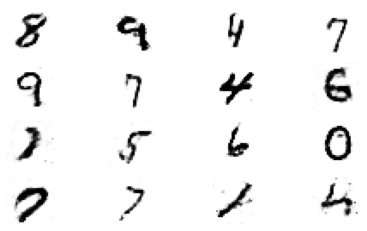

********************************************************************************************************************************** 

epoch -> [351/400], d_loss = 0.012923, g_loss = 0.008597


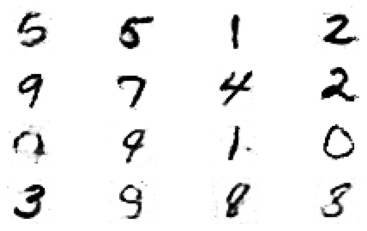

********************************************************************************************************************************** 

epoch -> [352/400], d_loss = 0.012874, g_loss = 0.008738


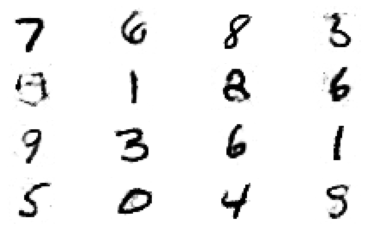

********************************************************************************************************************************** 

epoch -> [353/400], d_loss = 0.012907, g_loss = 0.008671


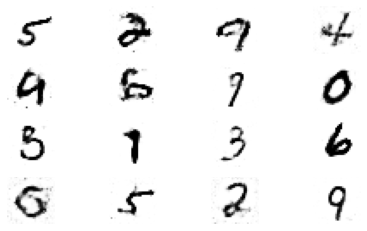

********************************************************************************************************************************** 

epoch -> [354/400], d_loss = 0.012885, g_loss = 0.008705


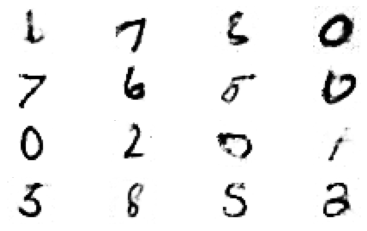

********************************************************************************************************************************** 

epoch -> [355/400], d_loss = 0.012940, g_loss = 0.008634


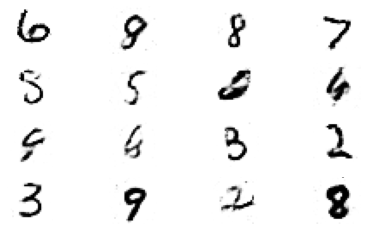

********************************************************************************************************************************** 

epoch -> [356/400], d_loss = 0.012892, g_loss = 0.008688


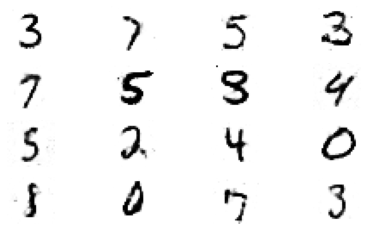

********************************************************************************************************************************** 

epoch -> [357/400], d_loss = 0.012907, g_loss = 0.008578


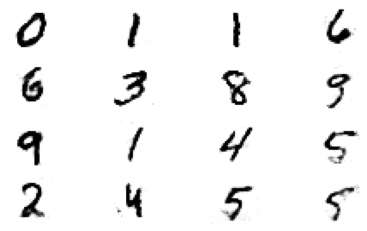

********************************************************************************************************************************** 

epoch -> [358/400], d_loss = 0.012956, g_loss = 0.008591


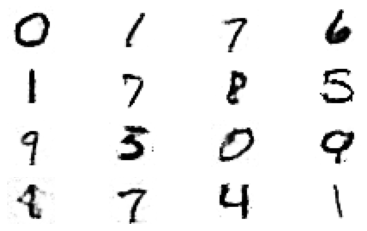

********************************************************************************************************************************** 

epoch -> [359/400], d_loss = 0.012898, g_loss = 0.008692


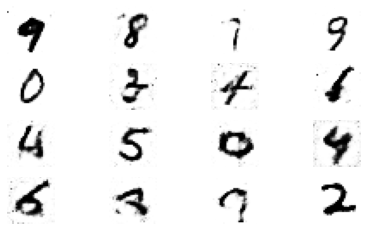

********************************************************************************************************************************** 

epoch -> [360/400], d_loss = 0.012930, g_loss = 0.008592


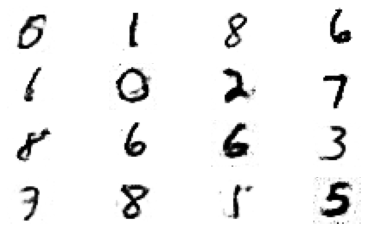

********************************************************************************************************************************** 

epoch -> [361/400], d_loss = 0.012969, g_loss = 0.008577


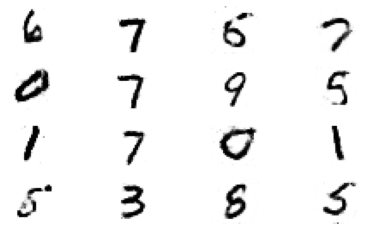

********************************************************************************************************************************** 

epoch -> [362/400], d_loss = 0.012951, g_loss = 0.008591


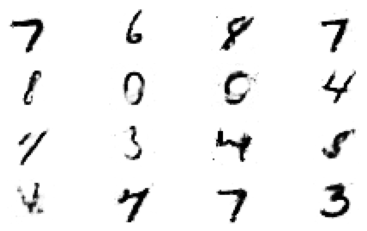

********************************************************************************************************************************** 

epoch -> [363/400], d_loss = 0.012948, g_loss = 0.008601


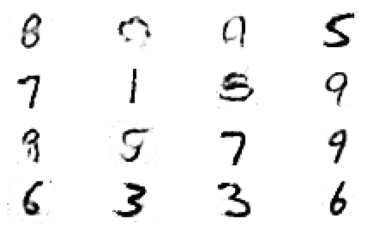

********************************************************************************************************************************** 

epoch -> [364/400], d_loss = 0.012919, g_loss = 0.008624


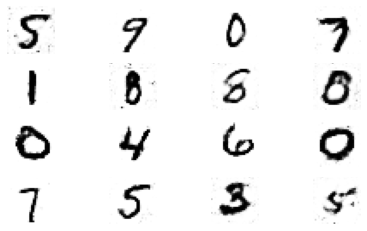

********************************************************************************************************************************** 

epoch -> [365/400], d_loss = 0.012941, g_loss = 0.008598


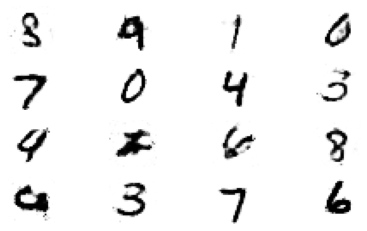

********************************************************************************************************************************** 

epoch -> [366/400], d_loss = 0.012924, g_loss = 0.008636


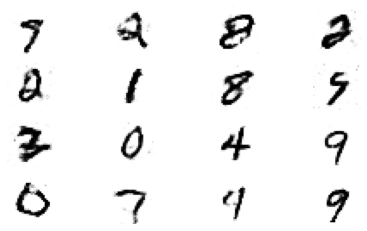

********************************************************************************************************************************** 

epoch -> [367/400], d_loss = 0.012875, g_loss = 0.008744


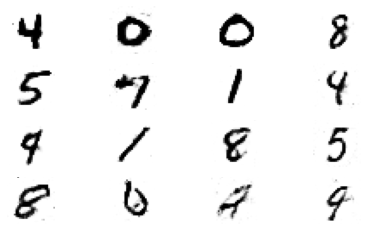

********************************************************************************************************************************** 

epoch -> [368/400], d_loss = 0.012933, g_loss = 0.008582


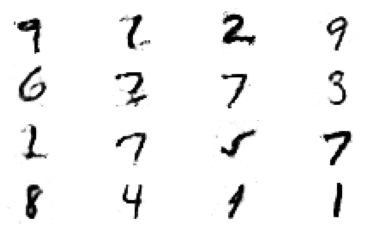

********************************************************************************************************************************** 

epoch -> [369/400], d_loss = 0.012895, g_loss = 0.008686


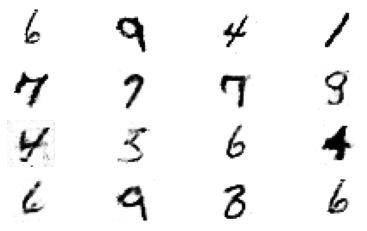

********************************************************************************************************************************** 

epoch -> [370/400], d_loss = 0.012924, g_loss = 0.008663


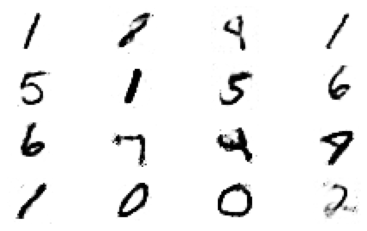

********************************************************************************************************************************** 

epoch -> [371/400], d_loss = 0.012925, g_loss = 0.008693


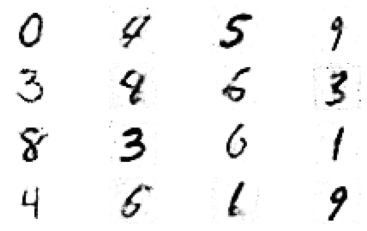

********************************************************************************************************************************** 

epoch -> [372/400], d_loss = 0.012913, g_loss = 0.008646


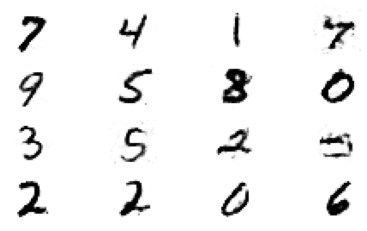

********************************************************************************************************************************** 

epoch -> [373/400], d_loss = 0.012898, g_loss = 0.008654


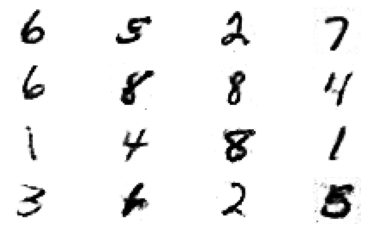

********************************************************************************************************************************** 

epoch -> [374/400], d_loss = 0.012933, g_loss = 0.008545


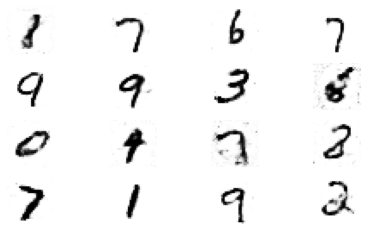

********************************************************************************************************************************** 

epoch -> [375/400], d_loss = 0.012929, g_loss = 0.008646


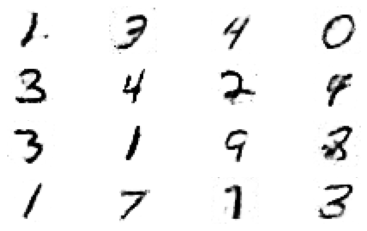

********************************************************************************************************************************** 

epoch -> [376/400], d_loss = 0.012931, g_loss = 0.008600


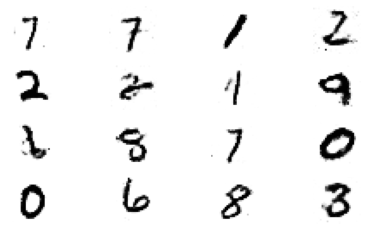

********************************************************************************************************************************** 

epoch -> [377/400], d_loss = 0.012902, g_loss = 0.008681


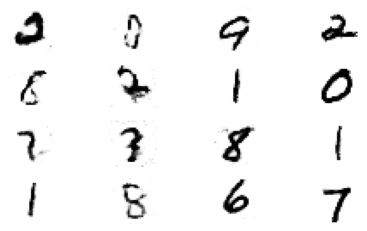

********************************************************************************************************************************** 

epoch -> [378/400], d_loss = 0.012972, g_loss = 0.008559


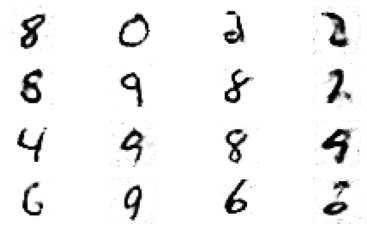

********************************************************************************************************************************** 

epoch -> [379/400], d_loss = 0.012928, g_loss = 0.008638


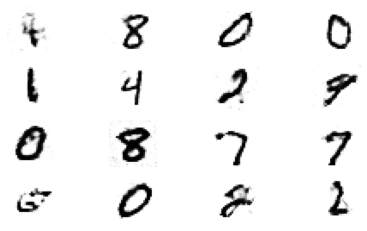

********************************************************************************************************************************** 

epoch -> [380/400], d_loss = 0.012931, g_loss = 0.008605


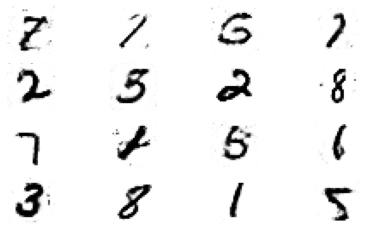

********************************************************************************************************************************** 

epoch -> [381/400], d_loss = 0.012903, g_loss = 0.008667


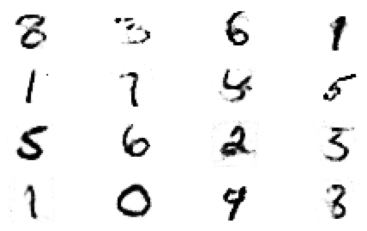

********************************************************************************************************************************** 

epoch -> [382/400], d_loss = 0.012892, g_loss = 0.008677


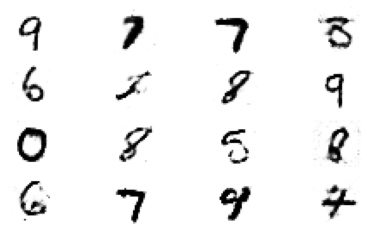

********************************************************************************************************************************** 

epoch -> [383/400], d_loss = 0.012973, g_loss = 0.008560


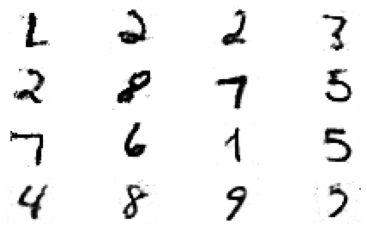

********************************************************************************************************************************** 

epoch -> [384/400], d_loss = 0.012906, g_loss = 0.008664


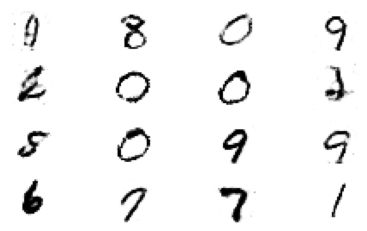

********************************************************************************************************************************** 

epoch -> [385/400], d_loss = 0.012862, g_loss = 0.008724


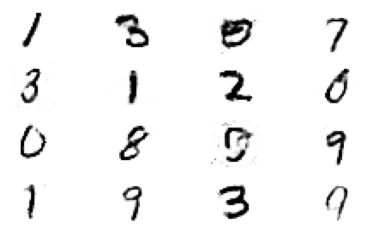

********************************************************************************************************************************** 

epoch -> [386/400], d_loss = 0.012892, g_loss = 0.008749


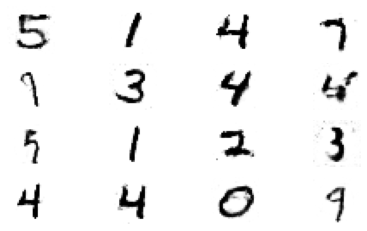

********************************************************************************************************************************** 

epoch -> [387/400], d_loss = 0.012904, g_loss = 0.008700


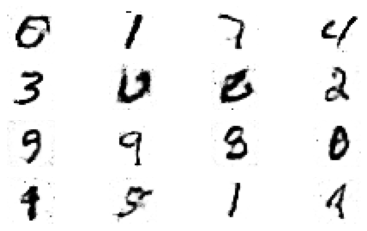

********************************************************************************************************************************** 

epoch -> [388/400], d_loss = 0.012924, g_loss = 0.008598


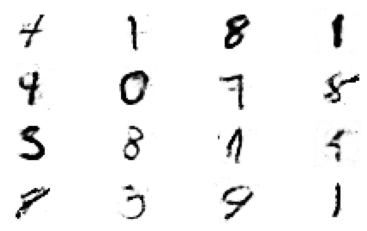

********************************************************************************************************************************** 

epoch -> [389/400], d_loss = 0.012837, g_loss = 0.008767


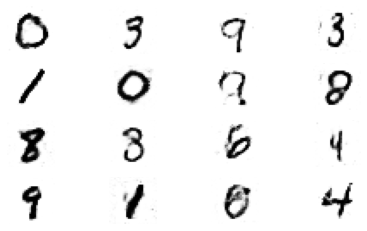

********************************************************************************************************************************** 

epoch -> [390/400], d_loss = 0.012887, g_loss = 0.008695


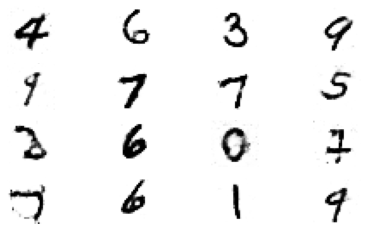

********************************************************************************************************************************** 

epoch -> [391/400], d_loss = 0.012874, g_loss = 0.008751


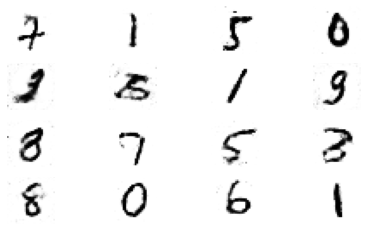

********************************************************************************************************************************** 

epoch -> [392/400], d_loss = 0.012900, g_loss = 0.008613


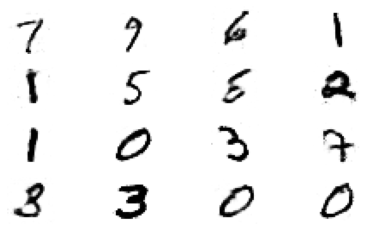

********************************************************************************************************************************** 

epoch -> [393/400], d_loss = 0.012868, g_loss = 0.008691


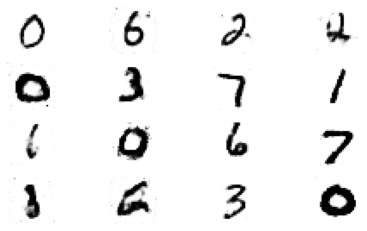

********************************************************************************************************************************** 

epoch -> [394/400], d_loss = 0.012913, g_loss = 0.008630


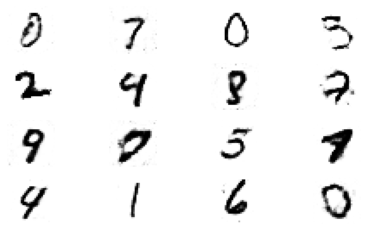

********************************************************************************************************************************** 

epoch -> [395/400], d_loss = 0.012919, g_loss = 0.008651


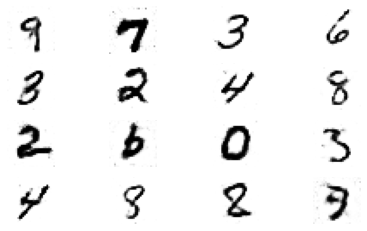

********************************************************************************************************************************** 

epoch -> [396/400], d_loss = 0.012938, g_loss = 0.008590


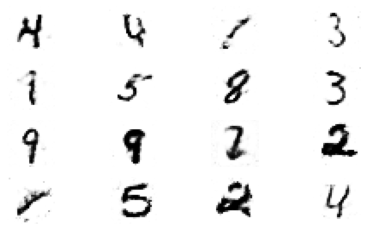

********************************************************************************************************************************** 

epoch -> [397/400], d_loss = 0.012868, g_loss = 0.008693


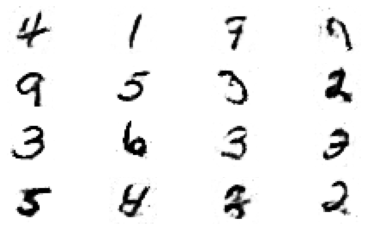

********************************************************************************************************************************** 

epoch -> [398/400], d_loss = 0.012926, g_loss = 0.008591


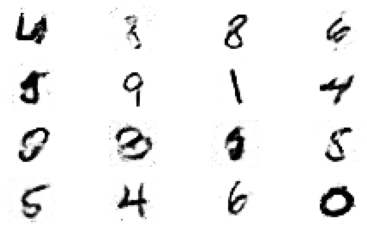

********************************************************************************************************************************** 

epoch -> [399/400], d_loss = 0.012916, g_loss = 0.008610


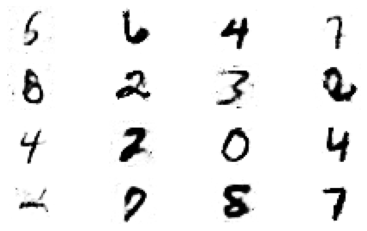

********************************************************************************************************************************** 

epoch -> [400/400], d_loss = 0.012902, g_loss = 0.008632


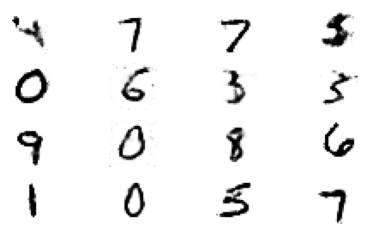

********************************************************************************************************************************** 



In [30]:
train(data_loader, discriminator, generator, d_optimizer, g_optimizer, loss,  epochs=400)